In [1]:
# numpy laibary
import numpy as np
# python laibary
import pandas as pd

# visulaization laibary
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# warning
import warnings
warnings.filterwarnings('ignore')

In [3]:
# regression model
from sklearn.linear_model import LogisticRegression

# classifier model
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

# ensemble model
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier,ExtraTreesClassifier

In [4]:
# model selection
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

In [5]:
# METRICS
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
from sklearn.metrics import plot_roc_curve

In [6]:
# import dataset
ds=pd.read_csv('fraud.csv')
ds

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


In [7]:
pd.set_option('display.max_columns',None)

In [8]:
# make dataframe
df=pd.DataFrame(ds)
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,FEMALE,Masters,craft-repair,paintball,unmarried,0,0,22-02-2015,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,6045 Andromedia St,20,1,YES,0,1,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,FEMALE,PhD,prof-specialty,sleeping,wife,70900,0,24-01-2015,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,3092 Texas Drive,23,1,YES,2,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,35100,0,23-01-2015,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,7629 5th St,4,3,?,2,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,MALE,Associate,handlers-cleaners,base-jumping,wife,0,0,26-02-2015,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,6128 Elm Lane,2,1,?,0,1,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


# LET'S DO EXPLORATRY DATA ANALYSIS(EDA)

In [9]:
df.shape

(1000, 40)

Here in our dataset 1000 rows of data and 40 columns.In out of 40 columns 39 columns are independent type and 1 column is dependent('Target') data variabl columns

In [10]:
# information about dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

# Information of Dataset-->
1. In this daatset 1000 rows and 40 columns.
2. float type dataset is 2 out of 40 columns.
3. int type dataset is 17 out of 40 columns.
4. object type dataset are 21 out of 40 columns.
5. In _c39 all values are null so we remove it directly.

In [11]:
# remove _c39 columns bcz of all null values
df=df.drop(['_c39'],axis=1)

In [12]:
#check white spaces in target
df.loc[df['fraud_reported']==' ']  

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported


No white space in target columns

In [13]:
df.isnull().sum().sum()

0

No null values are present in dataset

In [14]:
df=df.replace(" ",np.NaN)  #check blank space

In [15]:
df.isnull().any()

months_as_customer             False
age                            False
policy_number                  False
policy_bind_date               False
policy_state                   False
policy_csl                     False
policy_deductable              False
policy_annual_premium          False
umbrella_limit                 False
insured_zip                    False
insured_sex                    False
insured_education_level        False
insured_occupation             False
insured_hobbies                False
insured_relationship           False
capital-gains                  False
capital-loss                   False
incident_date                  False
incident_type                  False
collision_type                 False
incident_severity              False
authorities_contacted          False
incident_state                 False
incident_city                  False
incident_location              False
incident_hour_of_the_day       False
number_of_vehicles_involved    False
p

No blank space available

<AxesSubplot:>

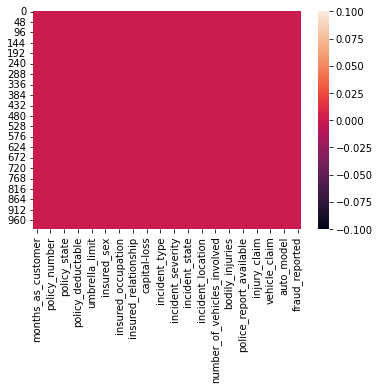

In [16]:
# null values visulaization
sns.heatmap(df.isnull())

In [17]:
# Checking number of unique values in each column
df.nunique().to_frame("No of Unique Values")

,No of Unique Values
months_as_customer,391
age,46
policy_number,1000
policy_bind_date,951
policy_state,3
policy_csl,3
policy_deductable,3
policy_annual_premium,991
umbrella_limit,11
insured_zip,995


# DATA PREPROCESSING

### Feature selection

Here in some feature variable more then 96%values are uniques spo we drop it.policy_number,insured_zip,incident_location,policy_annual_premium etc. It is not requried to predict model.

In [18]:
df=df.drop(['policy_number','insured_zip','incident_location'],axis=1)

In [19]:
df

,months_as_customer,age,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,17-10-2014,OH,250/500,1000,1406.91,0,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,27-06-2006,IN,250/500,2000,1197.22,5000000,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,06-09-2000,OH,100/300,2000,1413.14,5000000,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,25-05-1990,IL,250/500,2000,1415.74,6000000,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,06-06-2014,IL,500/1000,1000,1583.91,6000000,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,16-07-1991,OH,500/1000,1000,1310.80,0,FEMALE,Masters,craft-repair,paintball,unmarried,0,0,22-02-2015,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,20,1,YES,0,1,?,87200,17440,8720,61040,Honda,Accord,2006,N
996,285,41,05-01-2014,IL,100/300,1000,1436.79,0,FEMALE,PhD,prof-specialty,sleeping,wife,70900,0,24-01-2015,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,23,1,YES,2,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N
997,130,34,17-02-2003,OH,250/500,500,1383.49,3000000,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,35100,0,23-01-2015,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,4,3,?,2,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N
998,458,62,18-11-2011,IL,500/1000,2000,1356.92,5000000,MALE,Associate,handlers-cleaners,base-jumping,wife,0,0,26-02-2015,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,2,1,?,0,1,YES,46980,5220,5220,36540,Audi,A5,1998,N


In [20]:
# Checking the value counts of each columns
for i in df.columns:
        print(df[i].value_counts())
        print('*'*50)

194    8
128    7
254    7
140    7
210    7
      ..
390    1
411    1
453    1
448    1
17     1
Name: months_as_customer, Length: 391, dtype: int64
**************************************************
43    49
39    48
41    45
34    44
38    42
30    42
31    42
37    41
33    39
40    38
32    38
29    35
46    33
42    32
35    32
36    32
44    32
28    30
26    26
45    26
48    25
47    24
27    24
57    16
25    14
55    14
49    14
53    13
50    13
24    10
54    10
61    10
51     9
60     9
58     8
56     8
23     7
21     6
59     5
62     4
52     4
64     2
63     2
19     1
20     1
22     1
Name: age, dtype: int64
**************************************************
01-01-2006    3
28-04-1992    3
05-08-1992    3
14-12-1991    2
09-08-2004    2
             ..
03-06-2014    1
12-12-1998    1
18-02-1999    1
30-10-1997    1
11-11-1996    1
Name: policy_bind_date, Length: 951, dtype: int64
**************************************************
OH    352
IL    338
IN    310
Na

Zeros present in our dataset in nearly 50 to 80 % in some columns but mostly zeros are present in umbrella_limit so we remove it.

In [21]:
# number f zeros are present near 80% so drp it
df=df.drop(['umbrella_limit'],axis=1)

In [22]:
df

,months_as_customer,age,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,17-10-2014,OH,250/500,1000,1406.91,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,27-06-2006,IN,250/500,2000,1197.22,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,06-09-2000,OH,100/300,2000,1413.14,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,25-05-1990,IL,250/500,2000,1415.74,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,06-06-2014,IL,500/1000,1000,1583.91,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,16-07-1991,OH,500/1000,1000,1310.80,FEMALE,Masters,craft-repair,paintball,unmarried,0,0,22-02-2015,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,20,1,YES,0,1,?,87200,17440,8720,61040,Honda,Accord,2006,N
996,285,41,05-01-2014,IL,100/300,1000,1436.79,FEMALE,PhD,prof-specialty,sleeping,wife,70900,0,24-01-2015,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,23,1,YES,2,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N
997,130,34,17-02-2003,OH,250/500,500,1383.49,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,35100,0,23-01-2015,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,4,3,?,2,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N
998,458,62,18-11-2011,IL,500/1000,2000,1356.92,MALE,Associate,handlers-cleaners,base-jumping,wife,0,0,26-02-2015,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,2,1,?,0,1,YES,46980,5220,5220,36540,Audi,A5,1998,N


There are two variable which have data time funcation.In python no concept solve this date time so firstly we change into datetime funcation then extracted into day,month,year columns.
1. policy_bind_date
2. incident_date

In [23]:
# firstly change dates from object to datetime type
df['policy_bind_date']=pd.to_datetime(df['policy_bind_date'])
df['incident_date']=pd.to_datetime(df['incident_date'])

In [24]:
# check types od data 
df.dtypes

months_as_customer                      int64
age                                     int64
policy_bind_date               datetime64[ns]
policy_state                           object
policy_csl                             object
policy_deductable                       int64
policy_annual_premium                 float64
insured_sex                            object
insured_education_level                object
insured_occupation                     object
insured_hobbies                        object
insured_relationship                   object
capital-gains                           int64
capital-loss                            int64
incident_date                  datetime64[ns]
incident_type                          object
collision_type                         object
incident_severity                      object
authorities_contacted                  object
incident_state                         object
incident_city                          object
incident_hour_of_the_day          

Now we convert policy_blind_Date and Incident_Date from object to datetime function

In [25]:
# Now extracted into day,month,year variable
df['policy_bind_Day']=df['policy_bind_date'].dt.day
df['policy_bind_Month']=df['policy_bind_date'].dt.month
df['policy_bind_Year']=df['policy_bind_date'].dt.year

df['incident_Day']=df['incident_date'].dt.day
df['incident_Month']=df['incident_date'].dt.month
df['incident_Year']=df['incident_date'].dt.year

In [26]:
# Now remove Policy_blind_date and Incident_date variable.
df=df.drop(['policy_bind_date','incident_date'],axis=1)

we extractFrom both it into day,month,year variable.Now we no need it.

In [27]:
df

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month,incident_Year
0,328,48,OH,250/500,1000,1406.91,MALE,MD,craft-repair,sleeping,husband,53300,0,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,17,10,2014,25,1,2015
1,228,42,IN,250/500,2000,1197.22,MALE,MD,machine-op-inspct,reading,other-relative,0,0,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y,27,6,2006,21,1,2015
2,134,29,OH,100/300,2000,1413.14,FEMALE,PhD,sales,board-games,own-child,35100,0,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,9,6,2000,22,2,2015
3,256,41,IL,250/500,2000,1415.74,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,25,5,1990,1,10,2015
4,228,44,IL,500/1000,1000,1583.91,MALE,Associate,sales,board-games,unmarried,66000,-46000,Vehicle Theft,?,Minor Damage,None,NY,Arlington,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,6,6,2014,17,2,2015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,OH,500/1000,1000,1310.80,FEMALE,Masters,craft-repair,paintball,unmarried,0,0,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,20,1,YES,0,1,?,87200,17440,8720,61040,Honda,Accord,2006,N,16,7,1991,22,2,2015
996,285,41,IL,100/300,1000,1436.79,FEMALE,PhD,prof-specialty,sleeping,wife,70900,0,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,23,1,YES,2,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,1,5,2014,24,1,2015
997,130,34,OH,250/500,500,1383.49,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,35100,0,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,4,3,?,2,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,17,2,2003,23,1,2015
998,458,62,IL,500/1000,2000,1356.92,MALE,Associate,handlers-cleaners,base-jumping,wife,0,0,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,2,1,?,0,1,YES,46980,5220,5220,36540,Audi,A5,1998,N,18,11,2011,26,2,2015


In our dataset someplace this sign '?' are shown ,it is not a null values sign.Firstly  we need to fill it

In [28]:
# Checking which columns contains "?" sign
df[df.columns[(df=='?').any()]].nunique()

collision_type             4
property_damage            3
police_report_available    3
dtype: int64

In these 3 columns out of 38 these sign ? are present.It belong to object type data,so we need to remove it from highest values in these columns

In [29]:
# Checking highest value in this columns
print('In collision_type data variable highest valies is=',df['collision_type'].mode())
print('In property_damage data variable highest valies is=',df['property_damage'].mode())
print('In police_report_available data variable highest valies is=',df['police_report_available'].mode())

In collision_type data variable highest valies is= 0    Rear Collision
Name: collision_type, dtype: object
In property_damage data variable highest valies is= 0    ?
Name: property_damage, dtype: object
In police_report_available data variable highest valies is= 0     ?
1    NO
Name: police_report_available, dtype: object


In property_damage and police_report_available it shown that mostly data is covered by ? these sign so we see 2nd highest value in these cploumns

In [30]:
print('In police_report_available columns highest values are :\n',df.police_report_available.value_counts())
print('\n')
print('In property_damage columns highest values are :\n',df.property_damage.value_counts())

In police_report_available columns highest values are :
 ?      343
NO     343
YES    314
Name: police_report_available, dtype: int64


In property_damage columns highest values are :
 ?      360
NO     338
YES    302
Name: property_damage, dtype: int64


we clearly see that in these columns have NO has highest 2nd value.So we repalce ? sign by 'NO'

In [31]:
df['collision_type']=df['collision_type'].str.replace('?',df.collision_type.mode()[0])
df['property_damage']=df['property_damage'].str.replace('?','NO')
df['police_report_available']=df['police_report_available'].str.replace('?',"NO")

In [32]:
# Checking repalce values 
print("The value count of collision_type:\n", df["collision_type"].value_counts())
print("\n")
print("The value count of property_damage:\n", df["property_damage"].value_counts())
print("\n")
print("The value count of police_report_available:\n", df["police_report_available"].value_counts())

The value count of collision_type:
 Rear Collision     470
Side Collision     276
Front Collision    254
Name: collision_type, dtype: int64


The value count of property_damage:
 NO     698
YES    302
Name: property_damage, dtype: int64


The value count of police_report_available:
 NO     686
YES    314
Name: police_report_available, dtype: int64


Now our '?' sign is change

In [33]:
df

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month,incident_Year
0,328,48,OH,250/500,1000,1406.91,MALE,MD,craft-repair,sleeping,husband,53300,0,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,17,10,2014,25,1,2015
1,228,42,IN,250/500,2000,1197.22,MALE,MD,machine-op-inspct,reading,other-relative,0,0,Vehicle Theft,Rear Collision,Minor Damage,Police,VA,Riverwood,8,1,NO,0,0,NO,5070,780,780,3510,Mercedes,E400,2007,Y,27,6,2006,21,1,2015
2,134,29,OH,100/300,2000,1413.14,FEMALE,PhD,sales,board-games,own-child,35100,0,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,9,6,2000,22,2,2015
3,256,41,IL,250/500,2000,1415.74,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,5,1,NO,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,25,5,1990,1,10,2015
4,228,44,IL,500/1000,1000,1583.91,MALE,Associate,sales,board-games,unmarried,66000,-46000,Vehicle Theft,Rear Collision,Minor Damage,None,NY,Arlington,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,6,6,2014,17,2,2015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,OH,500/1000,1000,1310.80,FEMALE,Masters,craft-repair,paintball,unmarried,0,0,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,20,1,YES,0,1,NO,87200,17440,8720,61040,Honda,Accord,2006,N,16,7,1991,22,2,2015
996,285,41,IL,100/300,1000,1436.79,FEMALE,PhD,prof-specialty,sleeping,wife,70900,0,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,23,1,YES,2,3,NO,108480,18080,18080,72320,Volkswagen,Passat,2015,N,1,5,2014,24,1,2015
997,130,34,OH,250/500,500,1383.49,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,35100,0,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,4,3,NO,2,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,17,2,2003,23,1,2015
998,458,62,IL,500/1000,2000,1356.92,MALE,Associate,handlers-cleaners,base-jumping,wife,0,0,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,2,1,NO,0,1,YES,46980,5220,5220,36540,Audi,A5,1998,N,18,11,2011,26,2,2015


Here in our dataset / this sign shown,so firstly we remove it this sign and make csl_per_person and csl_per_accident column from policy_csl,and also convert it from object to numerical dataset

In [34]:
df['csl_per_person']=df['policy_csl'].str.split('/',expand=True)[0]
df['csl_per_accident']=df['policy_csl'].str.split('/',expand=True)[1]

we expand it into person and accident type columns from object to int type

In [35]:
# Converting object data type into integer data type
df['csl_per_person'] = df['csl_per_person'].astype('int64')
df['csl_per_accident'] = df['csl_per_accident'].astype('int64')

In [36]:
df['csl_per_person'].dtypes

dtype('int64')

In [37]:
df['csl_per_accident'].dtypes

dtype('int64')

In [38]:
df

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month,incident_Year,csl_per_person,csl_per_accident
0,328,48,OH,250/500,1000,1406.91,MALE,MD,craft-repair,sleeping,husband,53300,0,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,17,10,2014,25,1,2015,250,500
1,228,42,IN,250/500,2000,1197.22,MALE,MD,machine-op-inspct,reading,other-relative,0,0,Vehicle Theft,Rear Collision,Minor Damage,Police,VA,Riverwood,8,1,NO,0,0,NO,5070,780,780,3510,Mercedes,E400,2007,Y,27,6,2006,21,1,2015,250,500
2,134,29,OH,100/300,2000,1413.14,FEMALE,PhD,sales,board-games,own-child,35100,0,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,9,6,2000,22,2,2015,100,300
3,256,41,IL,250/500,2000,1415.74,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,5,1,NO,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,25,5,1990,1,10,2015,250,500
4,228,44,IL,500/1000,1000,1583.91,MALE,Associate,sales,board-games,unmarried,66000,-46000,Vehicle Theft,Rear Collision,Minor Damage,None,NY,Arlington,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,6,6,2014,17,2,2015,500,1000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,OH,500/1000,1000,1310.80,FEMALE,Masters,craft-repair,paintball,unmarried,0,0,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,20,1,YES,0,1,NO,87200,17440,8720,61040,Honda,Accord,2006,N,16,7,1991,22,2,2015,500,1000
996,285,41,IL,100/300,1000,1436.79,FEMALE,PhD,prof-specialty,sleeping,wife,70900,0,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,23,1,YES,2,3,NO,108480,18080,18080,72320,Volkswagen,Passat,2015,N,1,5,2014,24,1,2015,100,300
997,130,34,OH,250/500,500,1383.49,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,35100,0,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,4,3,NO,2,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,17,2,2003,23,1,2015,250,500
998,458,62,IL,500/1000,2000,1356.92,MALE,Associate,handlers-cleaners,base-jumping,wife,0,0,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,2,1,NO,0,1,YES,46980,5220,5220,36540,Audi,A5,1998,N,18,11,2011,26,2,2015,500,1000


In [39]:
# We extracted from policy_csl so we drop it
df=df.drop(['policy_csl'],axis=1)

In [40]:
# Let's extract age of the vehicle from auto_year by subtracting it from the year 2018
df["Vehicle_Age"] = 2018 - df["auto_year"]
df.drop("auto_year",axis=1, inplace = True)

In [41]:
# check dtypes
df.nunique()

months_as_customer             391
age                             46
policy_state                     3
policy_deductable                3
policy_annual_premium          991
insured_sex                      2
insured_education_level          7
insured_occupation              14
insured_hobbies                 20
insured_relationship             6
capital-gains                  338
capital-loss                   354
incident_type                    4
collision_type                   3
incident_severity                4
authorities_contacted            5
incident_state                   7
incident_city                    7
incident_hour_of_the_day        24
number_of_vehicles_involved      4
property_damage                  2
bodily_injuries                  3
witnesses                        4
police_report_available          2
total_claim_amount             763
injury_claim                   638
property_claim                 626
vehicle_claim                  726
auto_make           

Here in incident_Year only one type of value is present so we drop it,it look like not useful for us

In [42]:
# drop incident_year
df.drop(['incident_Year'],axis=1,inplace=True)

# For better understanding we separate both numerical and categorical type dataset

# Categorical Type Dataset

In [43]:
df1=df.select_dtypes(['object'])
df1

,policy_state,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,property_damage,police_report_available,auto_make,auto_model,fraud_reported
0,OH,MALE,MD,craft-repair,sleeping,husband,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,YES,YES,Saab,92x,Y
1,IN,MALE,MD,machine-op-inspct,reading,other-relative,Vehicle Theft,Rear Collision,Minor Damage,Police,VA,Riverwood,NO,NO,Mercedes,E400,Y
2,OH,FEMALE,PhD,sales,board-games,own-child,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,NO,NO,Dodge,RAM,N
3,IL,FEMALE,PhD,armed-forces,board-games,unmarried,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,NO,NO,Chevrolet,Tahoe,Y
4,IL,MALE,Associate,sales,board-games,unmarried,Vehicle Theft,Rear Collision,Minor Damage,None,NY,Arlington,NO,NO,Accura,RSX,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,OH,FEMALE,Masters,craft-repair,paintball,unmarried,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,YES,NO,Honda,Accord,N
996,IL,FEMALE,PhD,prof-specialty,sleeping,wife,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,YES,NO,Volkswagen,Passat,N
997,OH,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,NO,YES,Suburu,Impreza,N
998,IL,MALE,Associate,handlers-cleaners,base-jumping,wife,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,NO,YES,Audi,A5,N


In [44]:
df1=df1.replace(" ",np.nan)
df1

,policy_state,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,property_damage,police_report_available,auto_make,auto_model,fraud_reported
0,OH,MALE,MD,craft-repair,sleeping,husband,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,YES,YES,Saab,92x,Y
1,IN,MALE,MD,machine-op-inspct,reading,other-relative,Vehicle Theft,Rear Collision,Minor Damage,Police,VA,Riverwood,NO,NO,Mercedes,E400,Y
2,OH,FEMALE,PhD,sales,board-games,own-child,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,NO,NO,Dodge,RAM,N
3,IL,FEMALE,PhD,armed-forces,board-games,unmarried,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,NO,NO,Chevrolet,Tahoe,Y
4,IL,MALE,Associate,sales,board-games,unmarried,Vehicle Theft,Rear Collision,Minor Damage,None,NY,Arlington,NO,NO,Accura,RSX,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,OH,FEMALE,Masters,craft-repair,paintball,unmarried,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,YES,NO,Honda,Accord,N
996,IL,FEMALE,PhD,prof-specialty,sleeping,wife,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,YES,NO,Volkswagen,Passat,N
997,OH,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,NO,YES,Suburu,Impreza,N
998,IL,MALE,Associate,handlers-cleaners,base-jumping,wife,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,NO,YES,Audi,A5,N


In [45]:
# check null values in categorical type dataset
df1.isnull().sum().sum()

0

# UNI-VARIENT ANALYSIS

<AxesSubplot:xlabel='fraud_reported', ylabel='count'>

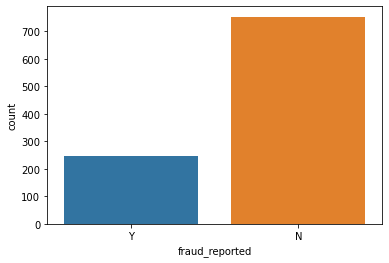

In [46]:
sns.countplot(df1.fraud_reported)

Y stands for 'YES' and N is stand for 'NO'.Yes mean fraud is true and NO mean fraud is not happen There is unblancing in data of target columns,we remove it but later

In [47]:
col=['insured_education_level','insured_occupation','insured_hobbies','insured_relationship','incident_type','collision_type','incident_severity','authorities_contacted','incident_state','incident_city']

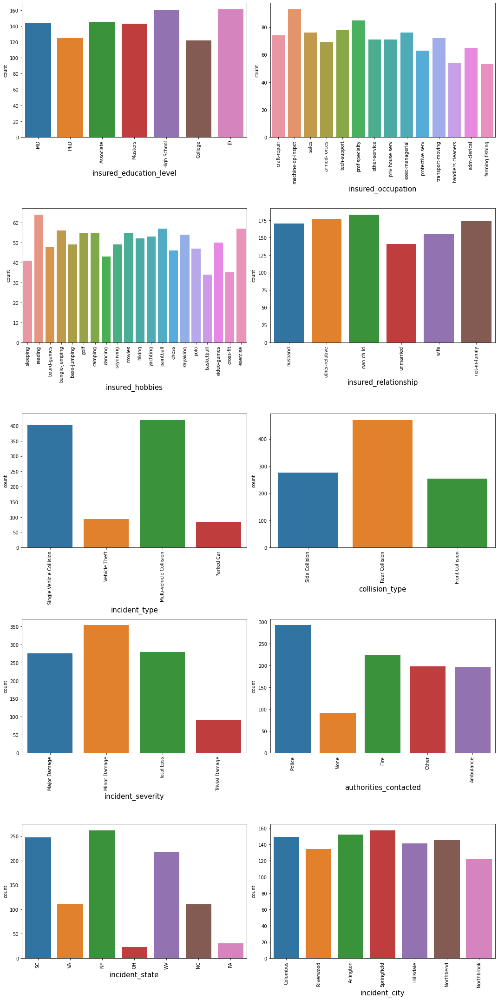

In [48]:
plt.figure(figsize=(15,30))
plotnumber=1
for i in col:
    if plotnumber:
        ax=plt.subplot(5,2,plotnumber)
        sns.countplot(df1[i])
        plt.xticks(rotation=90)
        plt.xlabel(i,fontsize=15)
        plotnumber+=1
plt.tight_layout()
plt.show()

# UNI-VARIANT ANALYSIS OF CATEGORICAL DATASET-->
1. In insured_education_level most space is occupied by JD and High School then others come.
2. In insured_occupation most space is covered by machine-op-inspect then others are comes.
3. In insured_hobbies most spaces are covered by reading than others come and others are almost the same spaces.
4. In insured_relationship spaces are occupied mostly by own-child then others come.
5. In incident_type most spaces covered by Multi-vehicle-collision and Single-vehicle-collision then others are comes.
6. mostly collisions from the rear side have occupied most space.
7. In incident-severity minor damages occupied large spaces.
8. In authorities_contacted most space is covered by Police then others are coming.
9. Most incidents happen in NY state then others are comes.
10. Incident cities have almost the same spaces in the dataset.

Pie plot for the column: policy_state


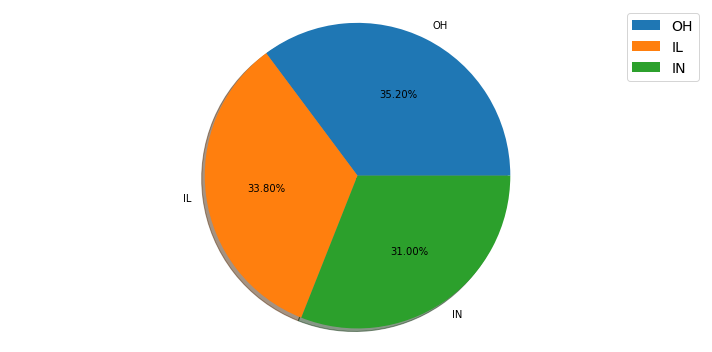

Pie plot for the column: insured_sex


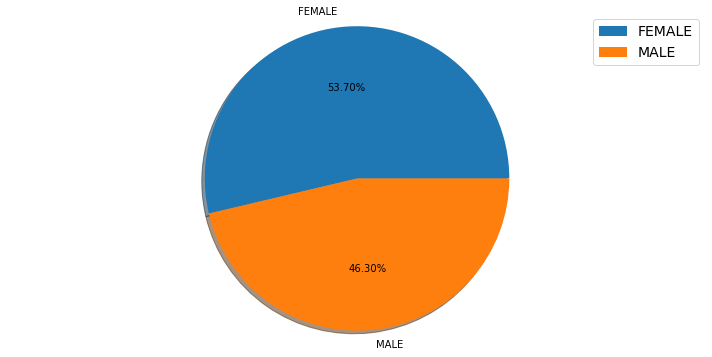

Pie plot for the column: insured_education_level


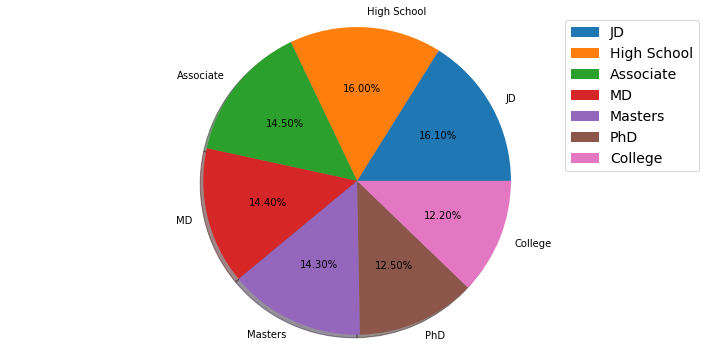

Pie plot for the column: insured_relationship


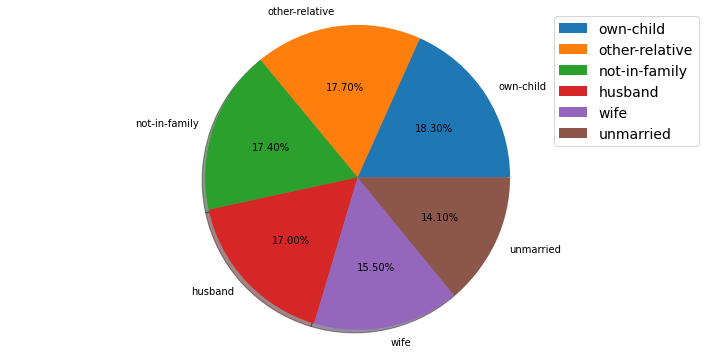

Pie plot for the column: incident_type


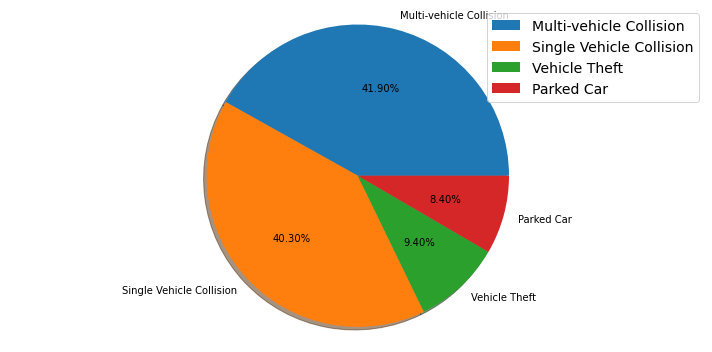

Pie plot for the column: collision_type


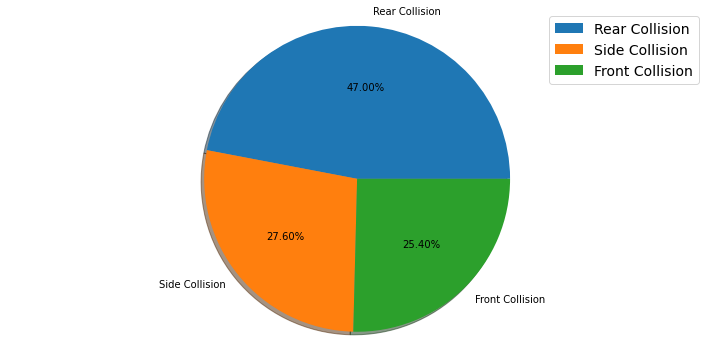

Pie plot for the column: property_damage


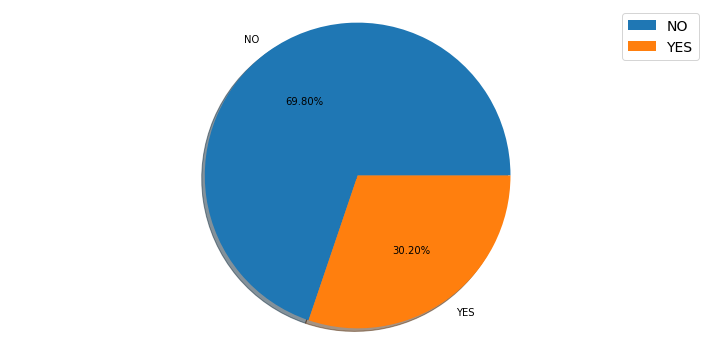

Pie plot for the column: police_report_available


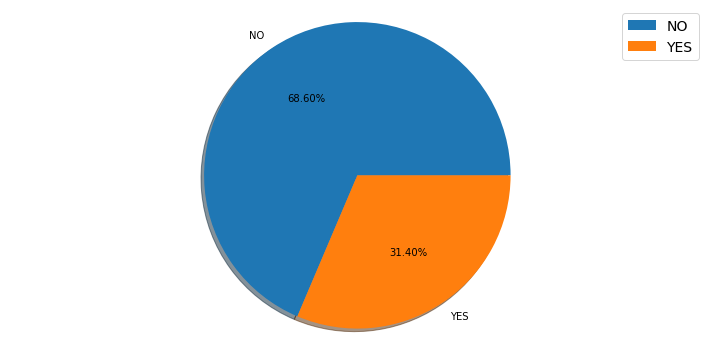

In [49]:
def generate_pie(i):
    plt.figure(figsize=(10,5))
    plt.pie(i.value_counts(), labels=i.value_counts().index, autopct='%1.2f%%',shadow=True,)
    plt.legend(prop={'size':14})
    plt.axis('equal')
    plt.tight_layout()
    return plt.show()

cols1 = ['policy_state', 'insured_sex', 'insured_education_level','insured_relationship', 'incident_type','collision_type','property_damage','police_report_available']

plotnumber=1
for j in df[cols1]:
    print(f"Pie plot for the column:", j)
    generate_pie(df[j])

# UNI-VARIENT ANALYSIS--->
1. Major space occupied in policy_state by OH then IL and IN
2. In insured_sex major space occupied by Female.
3. Insured_education_level High school occupied major space.
4. Insures_relationship own-child take major space.
5. multi-vehicle collision type occupied major space in incident_type.
6. In collion type rear collision take major space oyher then

# Bi-Varient Analysis

<AxesSubplot:xlabel='policy_state', ylabel='count'>

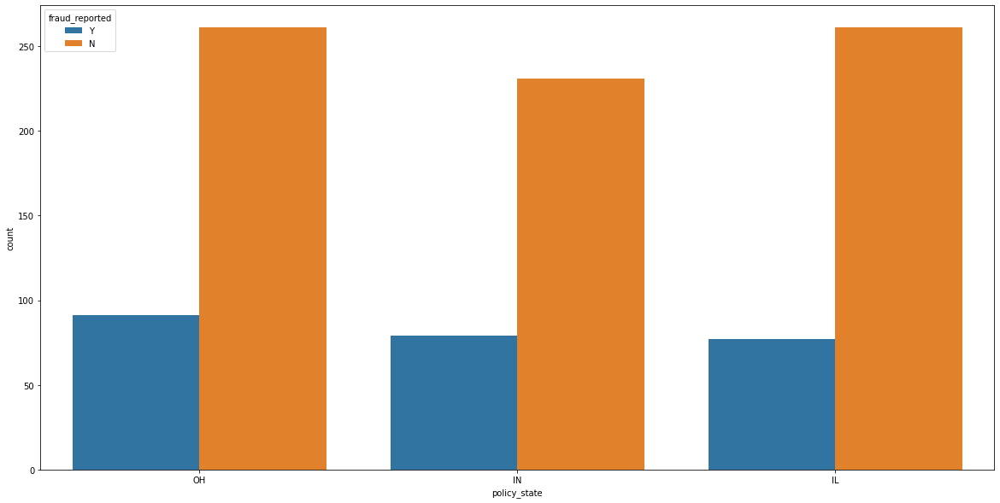

In [50]:
plt.figure(figsize=(20,10))
sns.countplot(df1.policy_state,hue=df1.fraud_reported)

Fraudentl level is very high in OH compared to other.

<AxesSubplot:xlabel='insured_sex', ylabel='count'>

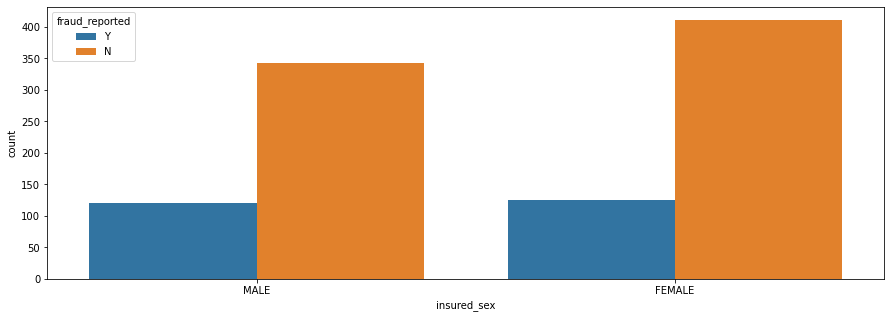

In [51]:
plt.figure(figsize=(15,5))
sns.countplot(df1.insured_sex,hue=df1.fraud_reported)

According to our dataset more fraud done by female insured_sex compared to other and maximum fraud not done by also female insured_sex

<AxesSubplot:xlabel='insured_education_level', ylabel='count'>

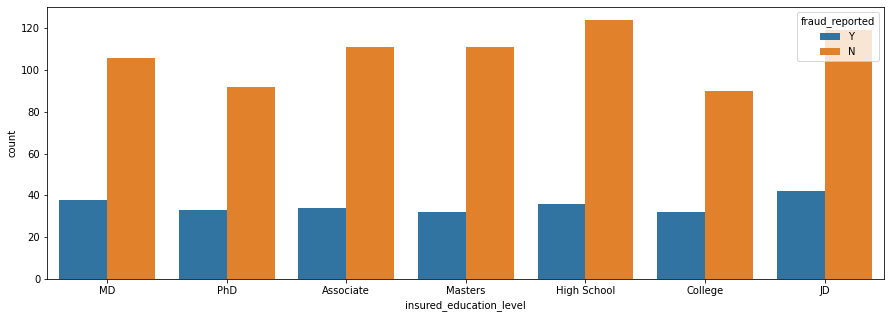

In [52]:
plt.figure(figsize=(15,5))
sns.countplot(df1.insured_education_level,hue=df1.fraud_reported)

Many fraudulent come from JD education_level background and many are insured if their level ner High School then there for fewer chances

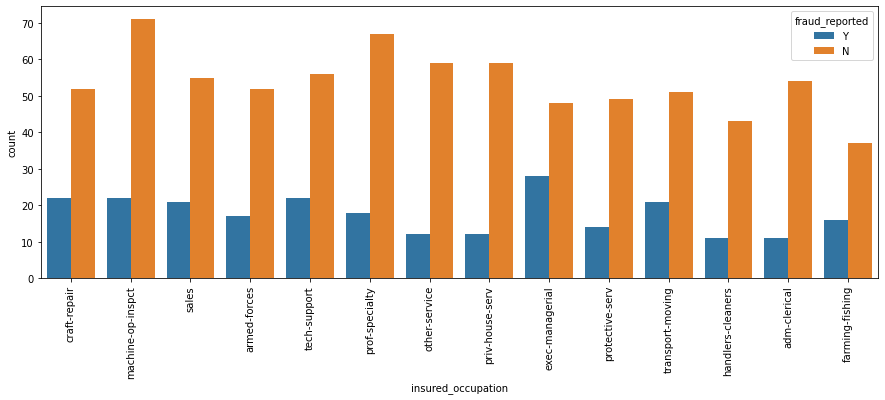

In [53]:
plt.figure(figsize=(15,5))
sns.countplot(df1.insured_occupation,hue=df1.fraud_reported)
plt.xticks(rotation=90)
plt.show()

Many fraudulently come from exec-managerial insured_occupation there high chance to make fraud compared to Machine-op-inspect background

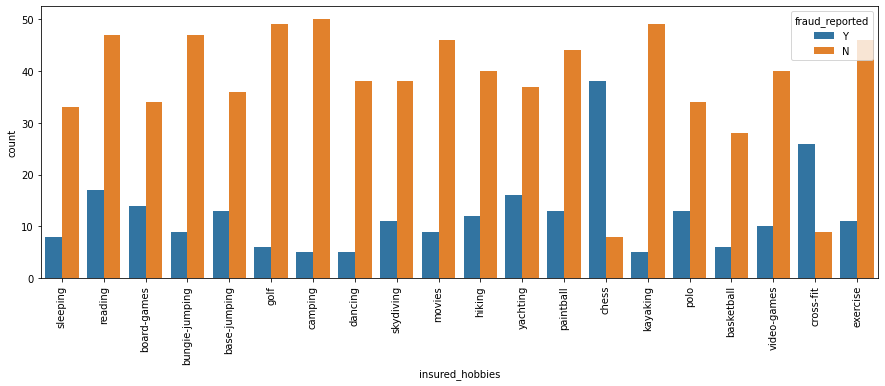

In [54]:
plt.figure(figsize=(15,5))
sns.countplot(df1.insured_hobbies,hue=df1.fraud_reported)
plt.xticks(rotation=90)
plt.show()

Many fraudulent hobbies are playing chess and who people have hobbies like camping, golf and kayaking have low chances 

<AxesSubplot:xlabel='insured_relationship', ylabel='count'>

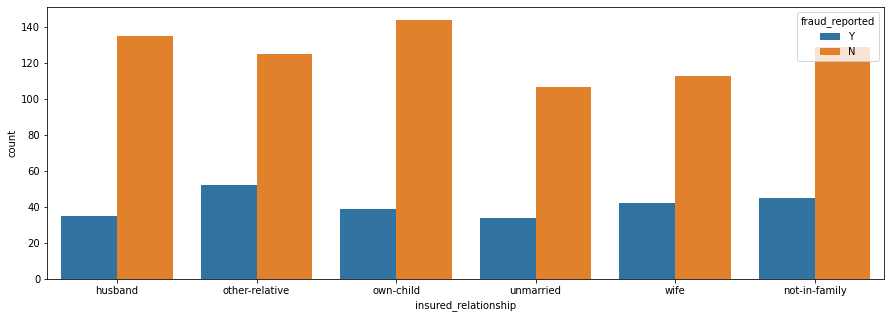

In [55]:
plt.figure(figsize=(15,5))
sns.countplot(df1.insured_relationship,hue=df1.fraud_reported)

who do fraud with the insurance company have other-relative of insured_relationship and when people have one child they have low chances

<AxesSubplot:xlabel='incident_type', ylabel='count'>

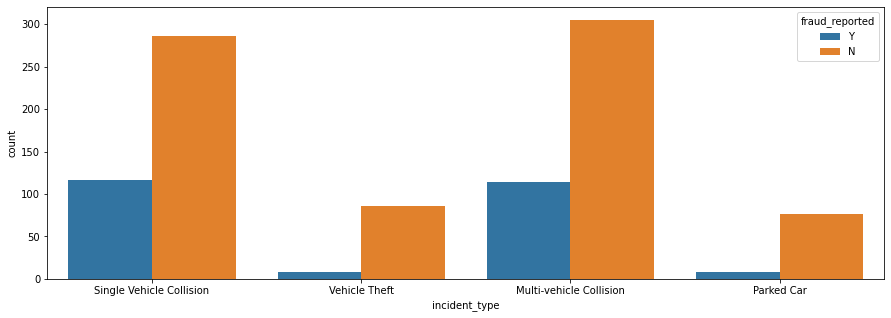

In [56]:
plt.figure(figsize=(15,5))
sns.countplot(df1.incident_type,hue=df1.fraud_reported)

when the multi-vehicle collision is incident_type then fraud with insurance companies increase.

<AxesSubplot:xlabel='collision_type', ylabel='count'>

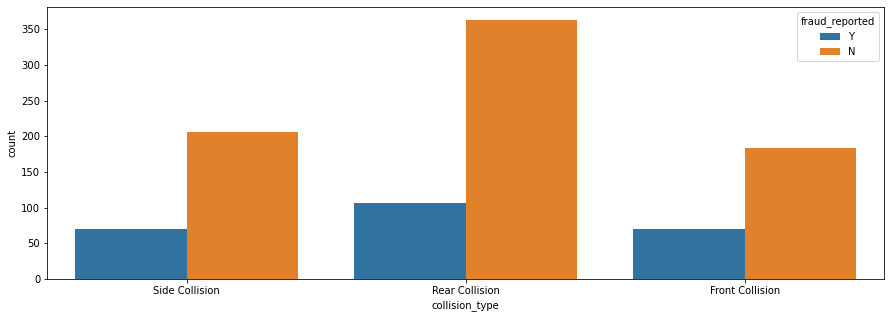

In [57]:
plt.figure(figsize=(15,5))
sns.countplot(df1.collision_type,hue=df1.fraud_reported)

Fraud is strart when collision type is Rear collision

<AxesSubplot:xlabel='incident_severity', ylabel='count'>

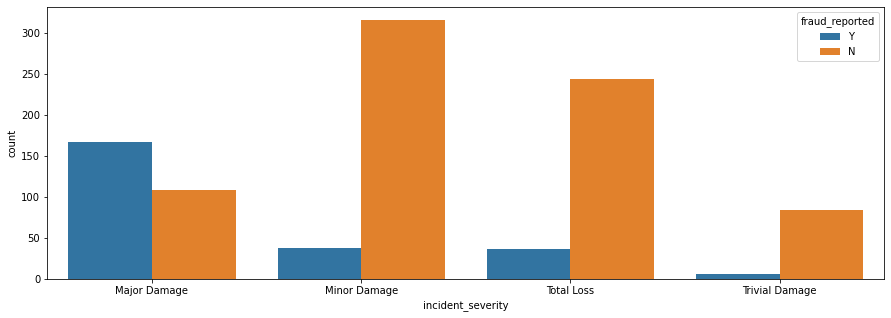

In [58]:
plt.figure(figsize=(15,5))
sns.countplot(df1.incident_severity,hue=df1.fraud_reported)

The fraud report is high in major damage compared to other loss like total loss and trivial damage

<AxesSubplot:xlabel='authorities_contacted', ylabel='count'>

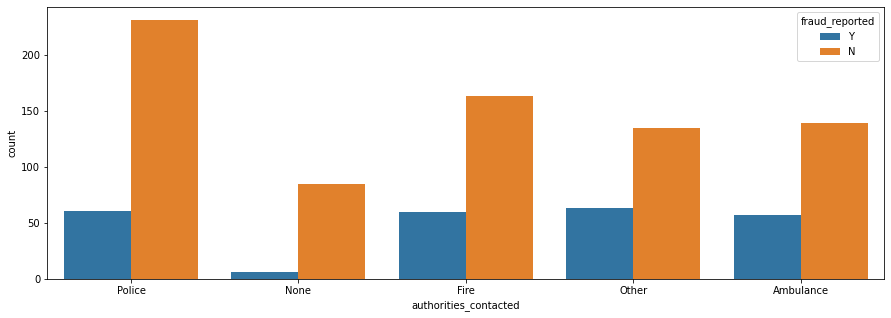

In [59]:
plt.figure(figsize=(15,5))
sns.countplot(df1.authorities_contacted,hue=df1.fraud_reported)

The police contacted cases are very high and the fraud report is in equal for all the authorities except None.

<AxesSubplot:xlabel='incident_state', ylabel='count'>

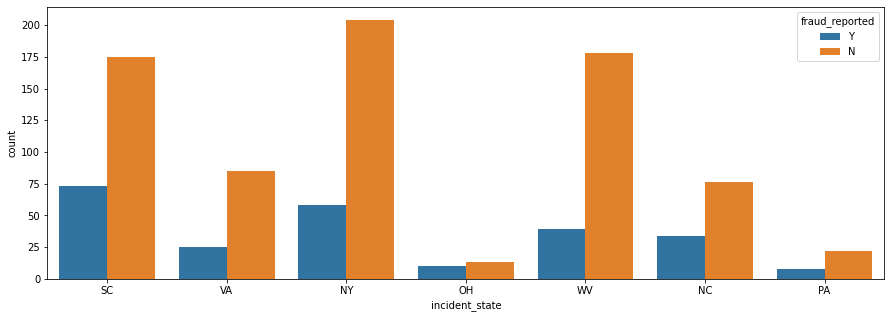

In [60]:
plt.figure(figsize=(15,5))
sns.countplot(df1.incident_state,hue=df1.fraud_reported)

In state SC high fraud report compare to another state

<AxesSubplot:xlabel='incident_city', ylabel='count'>

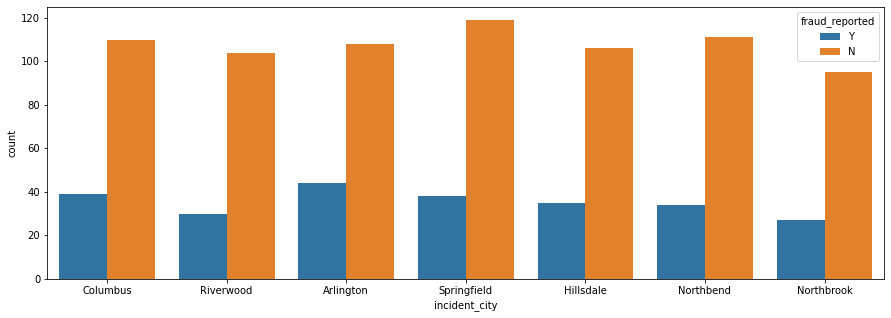

In [61]:
plt.figure(figsize=(15,5))
sns.countplot(df1.incident_city,hue=df1.fraud_reported)

In city Arlington files many fraud reports comparede to other city

<AxesSubplot:xlabel='property_damage', ylabel='count'>

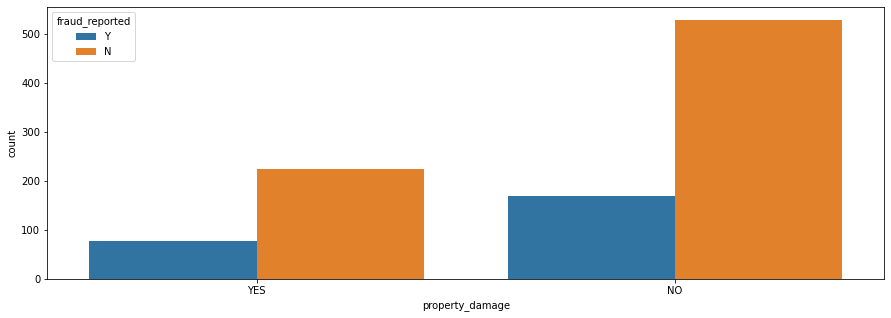

In [62]:
plt.figure(figsize=(15,5))
sns.countplot(df1.property_damage,hue=df1.fraud_reported)

When no property damages then fraud reports are high.

<AxesSubplot:xlabel='police_report_available', ylabel='count'>

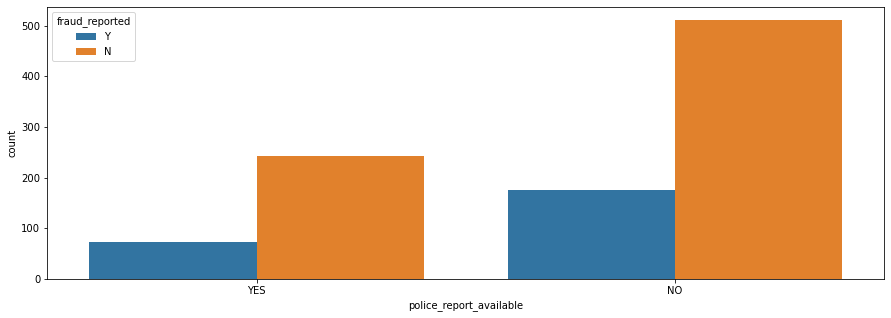

In [63]:
plt.figure(figsize=(15,5))
sns.countplot(df1.police_report_available,hue=df1.fraud_reported)

When police reports is not availabel then fraud report chances is high

<AxesSubplot:xlabel='auto_make', ylabel='count'>

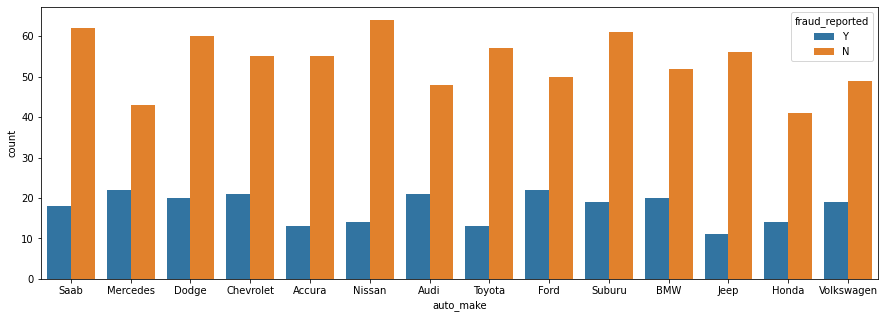

In [64]:
plt.figure(figsize=(15,5))
sns.countplot(df1.auto_make,hue=df1.fraud_reported)

In auto make fraude reported cases is same almost

# ENCODER METHOD

In [65]:
from sklearn.preprocessing import LabelEncoder

In [66]:
le=LabelEncoder()

In [67]:
for i in df1.columns:
    df1[i]=le.fit_transform(df1[i])

In [68]:
df1

,policy_state,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,property_damage,police_report_available,auto_make,auto_model,fraud_reported
0,2,1,4,2,17,0,2,2,0,4,4,1,1,1,10,1,1
1,1,1,4,6,15,2,3,1,1,4,5,5,0,0,8,12,1
2,2,0,6,11,2,3,0,1,1,4,1,1,0,0,4,30,0
3,0,0,6,1,2,4,2,0,0,4,2,0,0,0,3,34,1
4,0,1,0,11,2,4,3,1,1,2,1,0,0,0,0,31,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,2,0,5,2,13,4,2,0,1,1,0,4,1,0,6,6,0
996,0,0,6,9,17,5,2,1,0,1,4,3,1,0,13,28,0
997,2,0,5,1,3,2,0,2,1,4,0,0,0,1,11,19,0
998,0,1,0,5,0,5,2,1,0,3,1,0,0,1,1,5,0


# Numerical type Dataset

In [69]:
df2=df.select_dtypes(['int','float'])
df2

,months_as_customer,age,policy_deductable,policy_annual_premium,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month,csl_per_person,csl_per_accident,Vehicle_Age
0,328,48,1000,1406.91,53300,0,5,1,1,2,71610,6510,13020,52080,17,10,2014,25,1,250,500,14
1,228,42,2000,1197.22,0,0,8,1,0,0,5070,780,780,3510,27,6,2006,21,1,250,500,11
2,134,29,2000,1413.14,35100,0,7,3,2,3,34650,7700,3850,23100,9,6,2000,22,2,100,300,11
3,256,41,2000,1415.74,48900,-62400,5,1,1,2,63400,6340,6340,50720,25,5,1990,1,10,250,500,4
4,228,44,1000,1583.91,66000,-46000,20,1,0,1,6500,1300,650,4550,6,6,2014,17,2,500,1000,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,1000,1310.80,0,0,20,1,0,1,87200,17440,8720,61040,16,7,1991,22,2,500,1000,12
996,285,41,1000,1436.79,70900,0,23,1,2,3,108480,18080,18080,72320,1,5,2014,24,1,100,300,3
997,130,34,500,1383.49,35100,0,4,3,2,3,67500,7500,7500,52500,17,2,2003,23,1,250,500,22
998,458,62,2000,1356.92,0,0,2,1,0,1,46980,5220,5220,36540,18,11,2011,26,2,500,1000,20


In [70]:
# Check Null values
df1.isnull().sum().sum()

0

no null values are present in numerical dataset

# UNI-VARIENT ANALYSIS

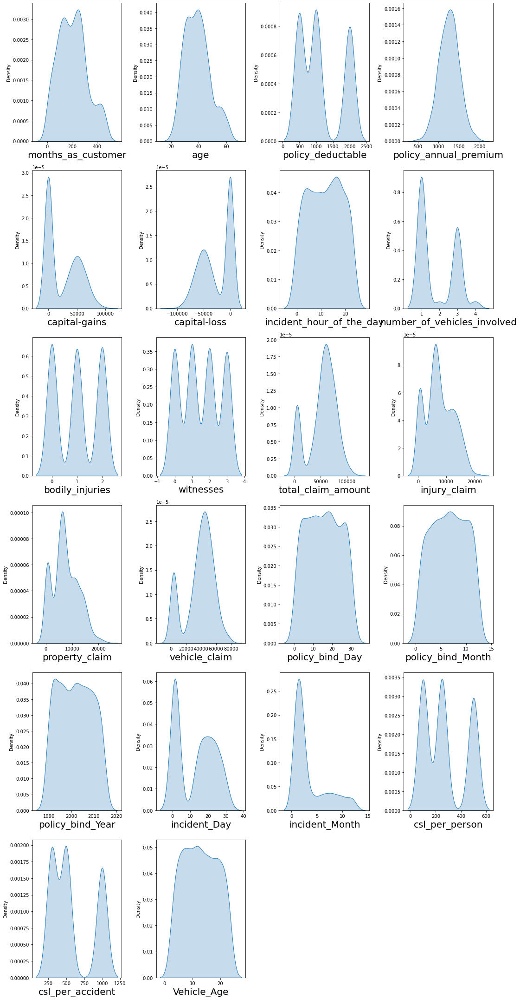

In [71]:
plt.figure(figsize=(15,30))
plotnumber=1
for i in df2.columns:
    ax=plt.subplot(6,4,plotnumber)
    sns.distplot(df2[i],hist=False,kde_kws={'shade':True})
    plt.xlabel(i,fontsize=20)
    plotnumber+=1
plt.tight_layout()
plt.show()

# Skewness by Distplot-->
1. Right side Skewness(mean>median)-->Month_as_customer,Age,Capital_loss,Injury_claim,Property_claim,Incident_month,
2. Left side Skewness(median>mean)-->Capital_gains,Policy_bind_day,Policy_bind_Month,Policy_blind_year,vehicle_age
3. Normally distribution(Approx)-->Policy_annual_premium,Policy_deductable,Number_of_vehicle_involved,Bodily_injuries,Witness,Total_claim_amount,Vehicle_claim,Incident_day,csl_per_person,csl_per_accident

# BI-VARIENT ANALYSIS

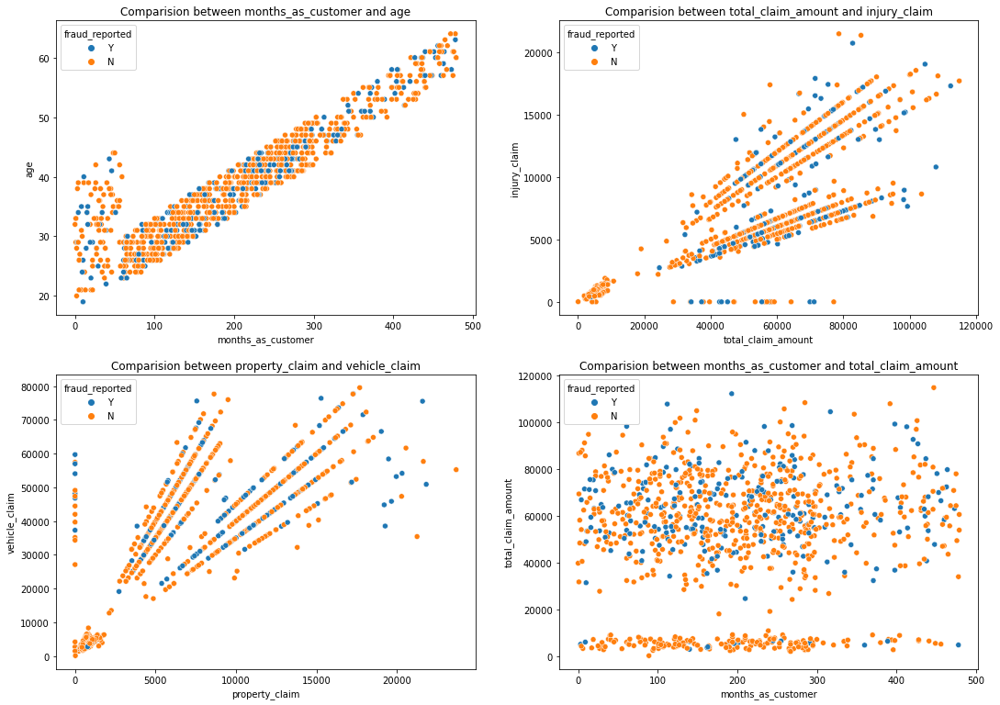

In [72]:
# Comparision between two variables
plt.figure(figsize=[18,13])

plt.subplot(2,2,1)
plt.title('Comparision between months_as_customer and age')
sns.scatterplot(df['months_as_customer'],df['age'],hue=df['fraud_reported']);

plt.subplot(2,2,2)
plt.title('Comparision between total_claim_amount and injury_claim')
sns.scatterplot(df['total_claim_amount'],df['injury_claim'],hue=df['fraud_reported']);

plt.subplot(2,2,3)
plt.title('Comparision between property_claim and vehicle_claim')
sns.scatterplot(df['property_claim'],df['vehicle_claim'],hue=df['fraud_reported']);

plt.subplot(2,2,4)
plt.title('Comparision between months_as_customer and total_claim_amount')
sns.scatterplot(df['months_as_customer'],df['total_claim_amount'],hue=df['fraud_reported']);

1. There is a positive linear relation between age and month_as_customer column. As age increases the month_as customers also increases, also the fraud reported is very less in htis case.
2. In the second graph we cna observe the positive linear relation, as total cliam amount increases, injury claim is also increases.
3. Third plot is also same as second one that is as the property claim increases, vehicle claim is also increases. 
4. In the fourth plot we can observe the data is scattered and there is no much relation between the features.

In [73]:
# There is no relatio between months_as_custommer and Total_claim_amount so we drop it
df2=df2.drop(['months_as_customer','total_claim_amount'],axis=1)

# Merge both dataset

In [74]:
df=pd.concat([df1,df2],axis=1)
df

,policy_state,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,property_damage,police_report_available,auto_make,auto_model,fraud_reported,age,policy_deductable,policy_annual_premium,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,injury_claim,property_claim,vehicle_claim,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month,csl_per_person,csl_per_accident,Vehicle_Age
0,2,1,4,2,17,0,2,2,0,4,4,1,1,1,10,1,1,48,1000,1406.91,53300,0,5,1,1,2,6510,13020,52080,17,10,2014,25,1,250,500,14
1,1,1,4,6,15,2,3,1,1,4,5,5,0,0,8,12,1,42,2000,1197.22,0,0,8,1,0,0,780,780,3510,27,6,2006,21,1,250,500,11
2,2,0,6,11,2,3,0,1,1,4,1,1,0,0,4,30,0,29,2000,1413.14,35100,0,7,3,2,3,7700,3850,23100,9,6,2000,22,2,100,300,11
3,0,0,6,1,2,4,2,0,0,4,2,0,0,0,3,34,1,41,2000,1415.74,48900,-62400,5,1,1,2,6340,6340,50720,25,5,1990,1,10,250,500,4
4,0,1,0,11,2,4,3,1,1,2,1,0,0,0,0,31,0,44,1000,1583.91,66000,-46000,20,1,0,1,1300,650,4550,6,6,2014,17,2,500,1000,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,2,0,5,2,13,4,2,0,1,1,0,4,1,0,6,6,0,38,1000,1310.80,0,0,20,1,0,1,17440,8720,61040,16,7,1991,22,2,500,1000,12
996,0,0,6,9,17,5,2,1,0,1,4,3,1,0,13,28,0,41,1000,1436.79,70900,0,23,1,2,3,18080,18080,72320,1,5,2014,24,1,100,300,3
997,2,0,5,1,3,2,0,2,1,4,0,0,0,1,11,19,0,34,500,1383.49,35100,0,4,3,2,3,7500,7500,52500,17,2,2003,23,1,250,500,22
998,0,1,0,5,0,5,2,1,0,3,1,0,0,1,1,5,0,62,2000,1356.92,0,0,2,1,0,1,5220,5220,36540,18,11,2011,26,2,500,1000,20


# STATISTIC OF DATASET

In [75]:
df.describe()

,policy_state,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,property_damage,police_report_available,auto_make,auto_model,fraud_reported,age,policy_deductable,policy_annual_premium,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,injury_claim,property_claim,vehicle_claim,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month,csl_per_person,csl_per_accident,Vehicle_Age
count,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000
mean,1.01400,0.463000,2.966000,6.653000,9.731000,2.416000,1.172000,1.022000,1.184000,2.167000,3.242000,2.966000,0.302000,0.314000,6.546000,19.318000,0.247000,38.948000,1136.000000,1256.406150,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,7433.420000,7399.570000,37928.950000,15.448000,6.559000,2001.604000,13.08400,3.407000,272.650000,580.200000,12.897000
std,0.83096,0.498879,1.948497,4.019048,5.674049,1.681003,1.081474,0.728043,0.939695,1.532142,2.155942,2.044266,0.459355,0.464349,4.034869,11.136107,0.431483,9.140287,611.864673,244.167395,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,4880.951853,4824.726179,18886.252893,8.850176,3.391758,7.360391,10.44318,3.276291,161.603196,287.420547,6.015861
min,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,19.000000,500.000000,433.330000,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,0.000000,0.000000,70.000000,1.000000,1.000000,1990.000000,1.00000,1.000000,100.000000,300.000000,3.000000
25%,0.00000,0.000000,1.000000,3.000000,5.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,3.000000,10.000000,0.000000,32.000000,500.000000,1089.607500,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,4295.000000,4445.000000,30292.500000,8.000000,4.000000,1995.000000,2.00000,1.000000,100.000000,300.000000,8.000000
50%,1.00000,0.000000,3.000000,7.000000,10.000000,2.000000,1.000000,1.000000,1.000000,2.000000,4.000000,3.000000,0.000000,0.000000,7.000000,20.000000,0.000000,38.000000,1000.000000,1257.200000,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,6775.000000,6750.000000,42100.000000,16.000000,7.000000,2002.000000,15.00000,2.000000,250.000000,500.000000,13.000000
75%,2.00000,1.000000,5.000000,10.000000,15.000000,4.000000,2.000000,2.000000,2.000000,4.000000,5.000000,5.000000,1.000000,1.000000,10.000000,29.000000,0.000000,44.000000,2000.000000,1415.695000,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,11305.000000,10885.000000,50822.500000,23.000000,9.000000,2008.000000,22.00000,5.000000,500.000000,1000.000000,18.000000
max,2.00000,1.000000,6.000000,13.000000,19.000000,5.000000,3.000000,2.000000,3.000000,4.000000,6.000000,6.000000,1.000000,1.000000,13.000000,38.000000,1.000000,64.000000,2000.000000,2047.590000,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,21450.000000,23670.000000,79560.000000,31.000000,12.000000,2015.000000,31.00000,12.000000,500.000000,1000.000000,23.000000


we already find that where is skewness and which type of skewness are present in our dataset.Now we finf outliers in dataset

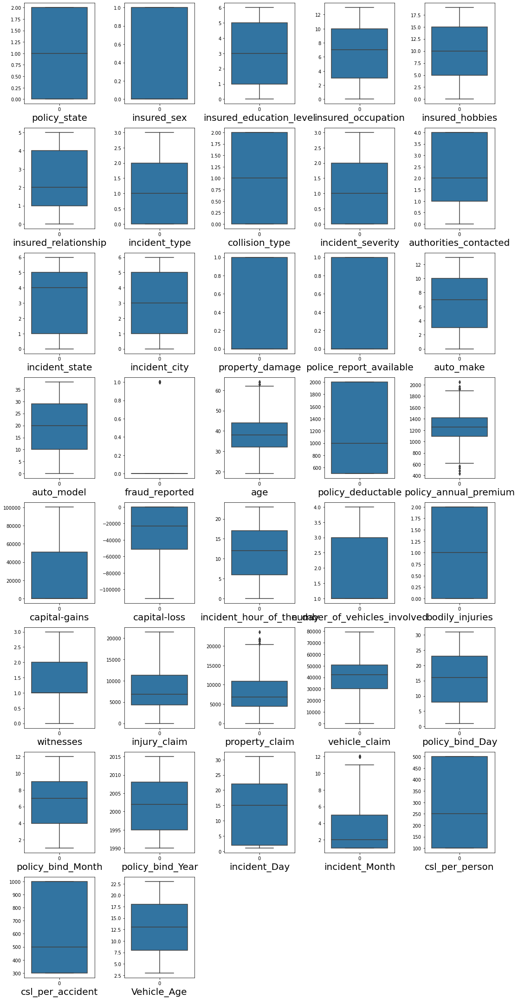

In [76]:
# for better understand outliers we plot boxplot
plt.figure(figsize=(15,30))
plotnumber=1
for i in df.columns:
    plt.subplot(8,5,plotnumber)
    sns.boxplot(data=df[i],orient='v')
    plt.xlabel(i,fontsize=20)
    plotnumber+=1
plt.tight_layout()
plt.show()

Outliers are present in dataset-->Age,policy_annual_premium_property,property_claims

# CHECK SKEWNESS

In [77]:
df.corr()

,policy_state,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,property_damage,police_report_available,auto_make,auto_model,fraud_reported,age,policy_deductable,policy_annual_premium,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,injury_claim,property_claim,vehicle_claim,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month,csl_per_person,csl_per_accident,Vehicle_Age
policy_state,1.000000,-0.020481,-0.034327,-0.031215,-0.038689,-0.018506,0.031848,0.052438,-0.026377,-0.016777,0.008723,-0.002077,-0.008465,0.069017,0.017124,-0.025253,0.029432,-0.014533,0.010033,0.012455,0.074551,-0.030338,0.029457,-0.042263,0.013384,0.022960,-0.046290,0.008406,0.001425,0.002277,0.071450,-0.007276,0.014745,0.023643,-0.003855,-0.007221,-0.002114
insured_sex,-0.020481,1.000000,0.009002,-0.006160,-0.020317,0.002855,0.009952,-0.014293,-0.028168,0.017914,-0.022379,0.014470,0.026969,0.006992,0.026457,-0.018421,0.030873,0.073337,-0.009733,0.038853,-0.020494,-0.021705,0.019290,0.018793,-0.020297,0.042463,0.000924,-0.014868,-0.029609,0.040713,-0.004033,-0.032891,-0.007280,0.024227,-0.021566,-0.028850,0.028247
insured_education_level,-0.034327,0.009002,1.000000,-0.020298,0.021807,-0.023488,0.013704,-0.019230,-0.006420,-0.010838,-0.005903,-0.018636,-0.048909,0.051640,0.055202,0.049445,0.008808,0.000969,0.015217,-0.019715,0.039912,0.041193,-0.057061,-0.003768,-0.012072,0.019211,0.081880,0.055794,0.068348,0.012610,-0.007118,0.018952,-0.058104,0.075083,0.009442,0.009521,-0.043509
insured_occupation,-0.031215,-0.006160,-0.020298,1.000000,-0.011077,-0.010171,0.003842,0.007401,0.004731,-0.007811,-0.022761,0.000390,-0.016378,-0.025232,0.042621,0.020584,0.001564,0.017220,-0.046733,0.035922,-0.007824,-0.020171,-0.018435,-0.015368,-0.000236,-0.014794,0.020211,0.003004,-0.000829,-0.006432,0.026140,-0.027085,-0.022105,0.019403,0.015042,0.014324,0.006676
insured_hobbies,-0.038689,-0.020317,0.021807,-0.011077,1.000000,-0.096772,0.007711,0.016700,-0.024688,-0.028104,0.085764,0.018542,0.036193,-0.027937,0.001525,0.030948,-0.046838,-0.081315,0.004061,-0.018019,0.054338,-0.031811,0.019979,0.012586,0.031373,-0.033971,0.028393,0.012535,-0.016814,0.028914,-0.004922,-0.013986,0.014893,-0.000082,-0.011580,-0.015361,0.014495
insured_relationship,-0.018506,0.002855,-0.023488,-0.010171,-0.096772,1.000000,0.033834,-0.005850,0.015498,-0.004070,-0.062331,-0.002288,-0.031931,-0.017471,-0.027028,0.063671,0.021043,0.074832,-0.022945,0.001925,-0.019439,-0.064453,0.004805,-0.047354,-0.001214,0.002362,0.029014,0.007332,-0.006256,0.010135,0.040811,-0.006494,-0.080738,0.045927,-0.020165,-0.012976,0.023345
incident_type,0.031848,0.009952,0.013704,0.003842,0.007711,0.033834,1.000000,-0.070920,0.159915,0.100450,0.037083,0.022117,0.020263,0.019917,-0.032784,-0.034302,-0.050376,-0.025626,-0.038411,0.053603,-0.045857,0.026101,-0.133387,-0.893274,-0.009733,-0.007299,-0.226704,-0.221409,-0.271635,-0.008791,0.035982,-0.049407,0.013166,-0.039270,0.012052,0.011933,0.053191
collision_type,0.052438,-0.014293,-0.019230,0.007401,0.016700,-0.005850,-0.070920,1.000000,-0.014702,0.062212,0.031680,0.032114,0.004059,0.047648,-0.007501,0.024323,-0.017315,-0.075642,-0.053912,0.036556,-0.006170,0.041494,0.044074,0.078999,-0.018146,-0.046659,-0.024996,-0.003844,-0.009127,0.018820,-0.039847,0.026098,0.047285,-0.026419,0.021710,0.022175,0.001204
incident_severity,-0.026377,-0.028168,-0.006420,0.004731,-0.024688,0.015498,0.159915,-0.014702,1.000000,0.164966,0.060019,-0.016541,-0.036102,0.002808,-0.008571,-0.046442,-0.405988,-0.058439,-0.015711,-0.011155,-0.013396,-0.018647,-0.071946,-0.168719,-0.018870,-0.011127,-0.276980,-0.301861,-0.361958,-0.041216,-0.032932,0.004322,0.017906,-0.007442,0.019989,0.017950,0.019646
authorities_contacted,-0.016777,0.017914,-0.010838,-0.007811,-0.028104,-0.004070,0.100

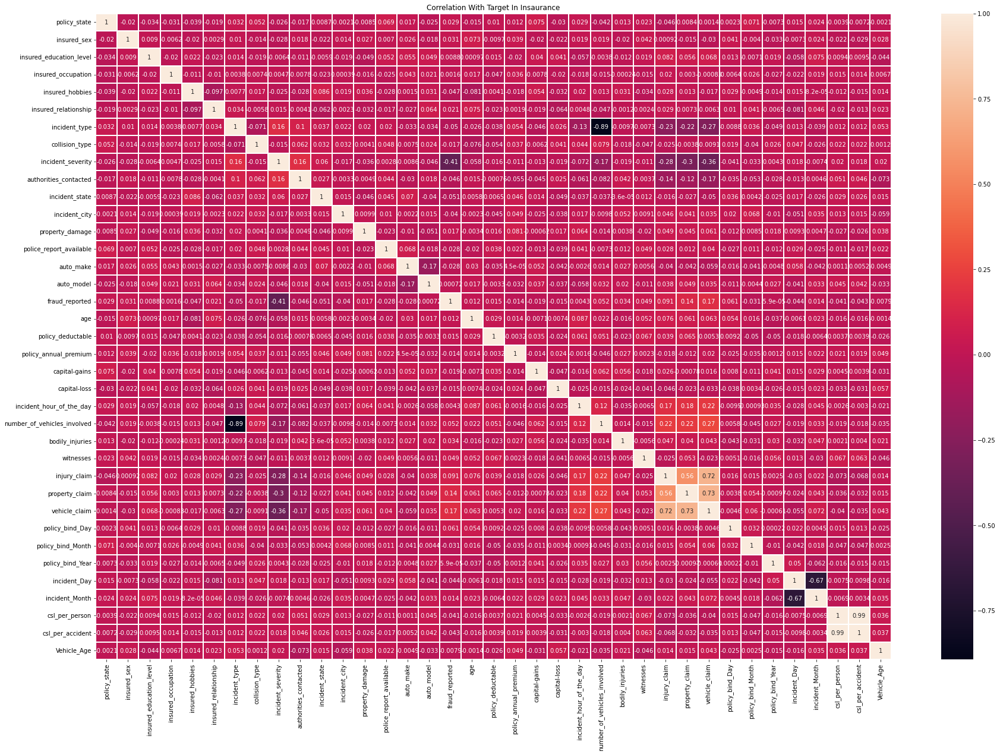

In [78]:
# for better understand we plot heatmap for it
plt.figure(figsize=(30,20))
sns.heatmap(df.corr(),annot=True,linewidth=2,linecolor='white')
plt.title('Correlation With Target In Insaurance')
plt.savefig('Correlation With Target In Insaurance')
plt.show()

1. policy_state correlated with target columns with 2.9%.It looks like good bond.
2. Insured_sex  correlated with target columns with 3.1%.It looks like good bond.
3. Insured_education_level  correlated with target columns with 0.88%.It looks like week bond.
4. Insured_occupation  correlated with target columns with 0.16%.It looks like poor bond.
5. Insured_hobbies  correlated with target columns with -4.7%.It looks like good bond.
6. Insured_relationship  correlated with target columns with 2.1%.It looks like good bond.
7. Incident_type  correlated with target columns with -5%.It looks like good bond.
8. Collision_type  correlated with target columns with -1.7%.It looks like good bond.
9. Incident_severity  correlated with target columns with -41%.It looks like strong bond.
10. Authorities_contacted  correlated with target columns with -4.6%.It looks like good bond.
11. Incident_state  correlated with target columns with -5.1%.It looks like good bond.
12. Incident_city  correlated with target columns with -4%.It looks like good bond.
13. Property_damage  correlated with target columns with 1.7%.It looks like good bond.
14. Police_report_available  correlated with target columns with -2.8%.It looks like good bond.
15. Auto_make  correlated with target columns with -2.8%.It looks like good bond.
16. Auto_model  correlated with target columns with 0.072%.It looks like week bond.
17. Age correlated with target columns with 1.2%.It looks like good bond.
18. Police_deductable  correlated with target columns with 1.5%.It looks like good bond.
19. Policy_annual_premium  correlated with target columns with -1.4%.It looks like good bond.
20. Capital_gains  correlated with target columns with -1.9%.It looks like good bond.
21. Capital_loss  correlated with target columns with -1.5%.It looks like good bond.
22. Incident_hour_of_day  correlated with target columns with 0.43%.It looks like week bond.
23. Number_of_vehicles_involved  correlated with target columns with 5.2%.It looks like good bond.
24. Bodily_injuries  correlated with target columns with 3.4%.It looks like good bond.
25. Witnesses correlated with target columns with 4.9%.It looks like good bond.
26. Injury_claim  correlated with target columns with 9.1%.It looks like good bond.
27. Property_claim  correlated with target columns with 14%.It looks like good bond.
28. Vehicle_claim correlated with target columns with 17%.It looks like very good bond.
29. Policy_bind_day  correlated with target columns with 6.1%.It looks like good bond.
30. Policy_bind_month correlated with target columns with -3.1%.It looks like good bond.
31. Policy_bind_year  correlated with target columns with 0.0059%.It looks like week bond.
32. Incident_day  correlated with target columns with -4.4%.It looks like good bond.
33. Incident_month  correlated with target columns with 1.4%.It looks like good bond.
34. Csl_per_person  correlated with target columns with 4.1%.It looks like good bond.
35. Csl_per_accident  correlated with target columns with -4.3%.It looks like good bond.
36. vehicle_age correlated with target columns with 0.79%.It looks like week bond.

Here in some frature are make week bond with target columns.this is not a good for prediction models.-->Insured_level,Insured_occuation,Auto_model,Incident_hour_of_day,Policy_bind_year,vehicle_age

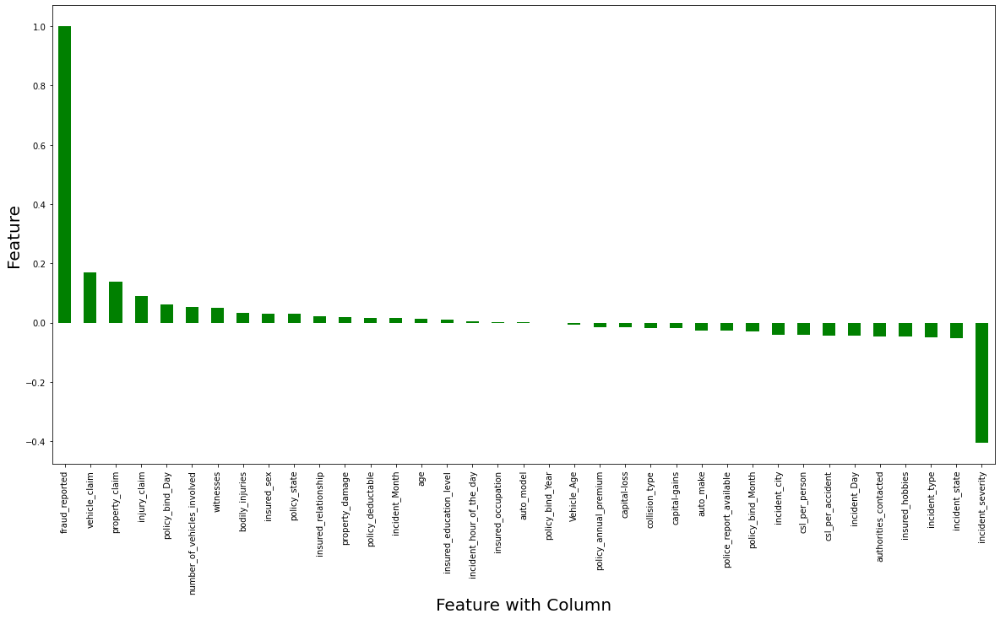

In [79]:
plt.figure(figsize=(20,10))
df.corr()['fraud_reported'].sort_values(ascending=False).plot(kind='bar',color='green')
plt.xlabel('Feature with Column',fontsize=20)
plt.ylabel('Feature',fontsize=20)
plt.show()

Remove Unwanted feature from separate dataset

In [80]:
df1=df1.drop(['auto_model','insured_education_level','insured_occupation'],axis=1)

In [81]:
df2=df2.drop(['incident_hour_of_the_day','policy_bind_Year','Vehicle_Age'],axis=1)

# MULTI-VARIENT ANALYSIS

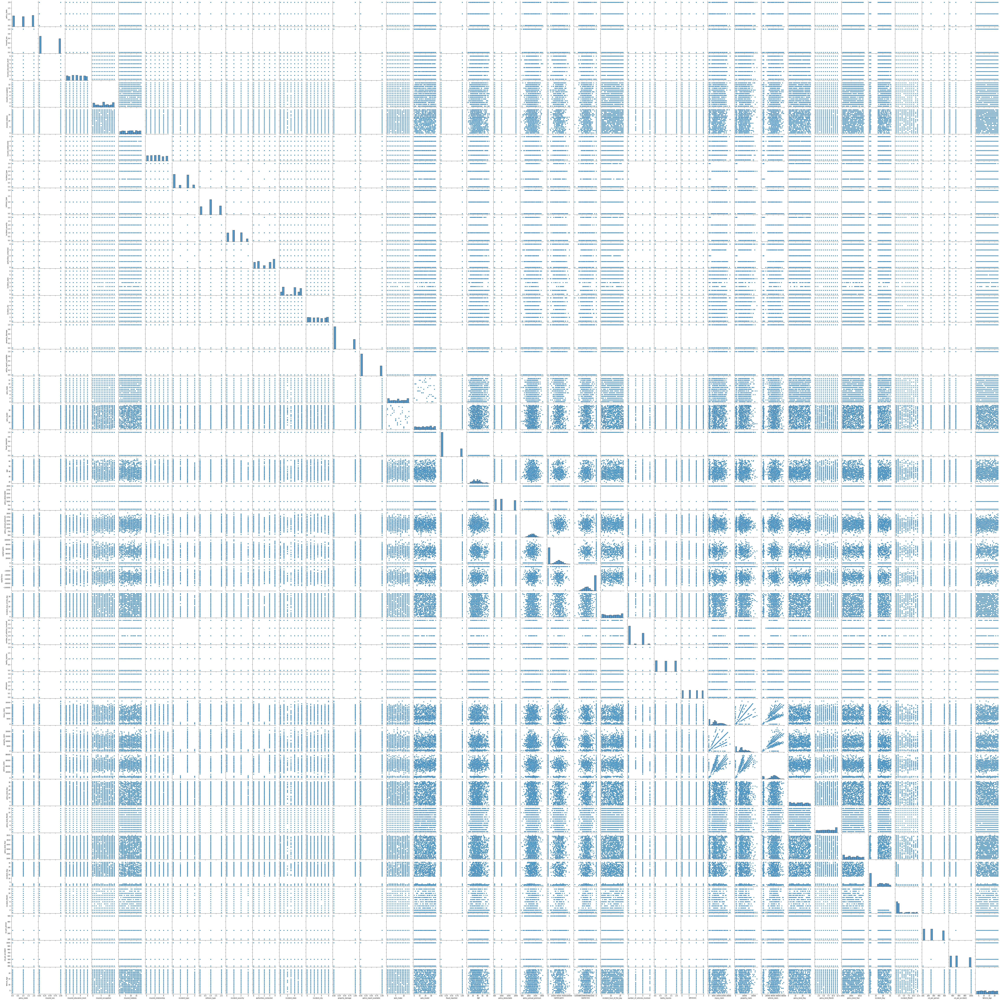

In [82]:
sns.pairplot(df)

# We not apply anay kind of taransformation on categorical dataset and target so we apply all transformation on numerical dataset

In [83]:
df2

,age,policy_deductable,policy_annual_premium,capital-gains,capital-loss,number_of_vehicles_involved,bodily_injuries,witnesses,injury_claim,property_claim,vehicle_claim,policy_bind_Day,policy_bind_Month,incident_Day,incident_Month,csl_per_person,csl_per_accident
0,48,1000,1406.91,53300,0,1,1,2,6510,13020,52080,17,10,25,1,250,500
1,42,2000,1197.22,0,0,1,0,0,780,780,3510,27,6,21,1,250,500
2,29,2000,1413.14,35100,0,3,2,3,7700,3850,23100,9,6,22,2,100,300
3,41,2000,1415.74,48900,-62400,1,1,2,6340,6340,50720,25,5,1,10,250,500
4,44,1000,1583.91,66000,-46000,1,0,1,1300,650,4550,6,6,17,2,500,1000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,38,1000,1310.80,0,0,1,0,1,17440,8720,61040,16,7,22,2,500,1000
996,41,1000,1436.79,70900,0,1,2,3,18080,18080,72320,1,5,24,1,100,300
997,34,500,1383.49,35100,0,3,2,3,7500,7500,52500,17,2,23,1,250,500
998,62,2000,1356.92,0,0,1,0,1,5220,5220,36540,18,11,26,2,500,1000


# Check skewness

In [84]:
# zscore laibary
from scipy.stats import zscore

In [85]:
(np.abs(zscore(df2))<3).all().all()

False

Outliers are present in numerical dataset

In [86]:
(np.abs(zscore(df2))<3).all()

age                             True
policy_deductable               True
policy_annual_premium          False
capital-gains                   True
capital-loss                   False
number_of_vehicles_involved     True
bodily_injuries                 True
witnesses                       True
injury_claim                    True
property_claim                 False
vehicle_claim                   True
policy_bind_Day                 True
policy_bind_Month               True
incident_Day                    True
incident_Month                  True
csl_per_person                  True
csl_per_accident                True
dtype: bool

Outliers are present in dataset-->policy_annual_premium,capital-loss ,property_claim  

# IQR METHOD

In [87]:
q1=df2.quantile(0.25)
q1

age                               32.0000
policy_deductable                500.0000
policy_annual_premium           1089.6075
capital-gains                      0.0000
capital-loss                  -51500.0000
number_of_vehicles_involved        1.0000
bodily_injuries                    0.0000
witnesses                          1.0000
injury_claim                    4295.0000
property_claim                  4445.0000
vehicle_claim                  30292.5000
policy_bind_Day                    8.0000
policy_bind_Month                  4.0000
incident_Day                       2.0000
incident_Month                     1.0000
csl_per_person                   100.0000
csl_per_accident                 300.0000
Name: 0.25, dtype: float64

In [88]:
q2=df2.quantile(0.75)
q2

age                               44.000
policy_deductable               2000.000
policy_annual_premium           1415.695
capital-gains                  51025.000
capital-loss                       0.000
number_of_vehicles_involved        3.000
bodily_injuries                    2.000
witnesses                          2.000
injury_claim                   11305.000
property_claim                 10885.000
vehicle_claim                  50822.500
policy_bind_Day                   23.000
policy_bind_Month                  9.000
incident_Day                      22.000
incident_Month                     5.000
csl_per_person                   500.000
csl_per_accident                1000.000
Name: 0.75, dtype: float64

In [89]:
iqr=q2-q1
iqr

age                               12.0000
policy_deductable               1500.0000
policy_annual_premium            326.0875
capital-gains                  51025.0000
capital-loss                   51500.0000
number_of_vehicles_involved        2.0000
bodily_injuries                    2.0000
witnesses                          1.0000
injury_claim                    7010.0000
property_claim                  6440.0000
vehicle_claim                  20530.0000
policy_bind_Day                   15.0000
policy_bind_Month                  5.0000
incident_Day                      20.0000
incident_Month                     4.0000
csl_per_person                   400.0000
csl_per_accident                 700.0000
dtype: float64

In [90]:
upper=q2+(1.5*iqr)
lower=q1-(1.5*iqr)

In [91]:
df2=df2[(df2>lower) & (df2<upper)]
df2

,age,policy_deductable,policy_annual_premium,capital-gains,capital-loss,number_of_vehicles_involved,bodily_injuries,witnesses,injury_claim,property_claim,vehicle_claim,policy_bind_Day,policy_bind_Month,incident_Day,incident_Month,csl_per_person,csl_per_accident
0,48.0,1000,1406.91,53300,0,1,1,2,6510,13020.0,52080,17,10,25,1.0,250,500
1,42.0,2000,1197.22,0,0,1,0,0,780,780.0,3510,27,6,21,1.0,250,500
2,29.0,2000,1413.14,35100,0,3,2,3,7700,3850.0,23100,9,6,22,2.0,100,300
3,41.0,2000,1415.74,48900,-62400,1,1,2,6340,6340.0,50720,25,5,1,10.0,250,500
4,44.0,1000,1583.91,66000,-46000,1,0,1,1300,650.0,4550,6,6,17,2.0,500,1000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,38.0,1000,1310.80,0,0,1,0,1,17440,8720.0,61040,16,7,22,2.0,500,1000
996,41.0,1000,1436.79,70900,0,1,2,3,18080,18080.0,72320,1,5,24,1.0,100,300
997,34.0,500,1383.49,35100,0,3,2,3,7500,7500.0,52500,17,2,23,1.0,250,500
998,NaN,2000,1356.92,0,0,1,0,1,5220,5220.0,36540,18,11,26,2.0,500,1000


In [92]:
# Check null values after apply iqr method
df2.isnull().sum()

age                             8
policy_deductable               0
policy_annual_premium           9
capital-gains                   0
capital-loss                    0
number_of_vehicles_involved     0
bodily_injuries                 0
witnesses                       0
injury_claim                    0
property_claim                  6
vehicle_claim                   0
policy_bind_Day                 0
policy_bind_Month               0
incident_Day                    0
incident_Month                 58
csl_per_person                  0
csl_per_accident                0
dtype: int64

remove null values fromm dataset

In [93]:
from sklearn.impute import SimpleImputer

In [94]:
imp=SimpleImputer(strategy='mean')

In [95]:
for i in df2.columns:
    df2[i]=imp.fit_transform(df2[i].values.reshape(-1,1))

In [96]:
df2

,age,policy_deductable,policy_annual_premium,capital-gains,capital-loss,number_of_vehicles_involved,bodily_injuries,witnesses,injury_claim,property_claim,vehicle_claim,policy_bind_Day,policy_bind_Month,incident_Day,incident_Month,csl_per_person,csl_per_accident
0,48.000000,1000.0,1406.91,53300.0,0.0,1.0,1.0,2.0,6510.0,13020.0,52080.0,17.0,10.0,25.0,1.0,250.0,500.0
1,42.000000,2000.0,1197.22,0.0,0.0,1.0,0.0,0.0,780.0,780.0,3510.0,27.0,6.0,21.0,1.0,250.0,500.0
2,29.000000,2000.0,1413.14,35100.0,0.0,3.0,2.0,3.0,7700.0,3850.0,23100.0,9.0,6.0,22.0,2.0,100.0,300.0
3,41.000000,2000.0,1415.74,48900.0,-62400.0,1.0,1.0,2.0,6340.0,6340.0,50720.0,25.0,5.0,1.0,10.0,250.0,500.0
4,44.000000,1000.0,1583.91,66000.0,-46000.0,1.0,0.0,1.0,1300.0,650.0,4550.0,6.0,6.0,17.0,2.0,500.0,1000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,38.000000,1000.0,1310.80,0.0,0.0,1.0,0.0,1.0,17440.0,8720.0,61040.0,16.0,7.0,22.0,2.0,500.0,1000.0
996,41.000000,1000.0,1436.79,70900.0,0.0,1.0,2.0,3.0,18080.0,18080.0,72320.0,1.0,5.0,24.0,1.0,100.0,300.0
997,34.000000,500.0,1383.49,35100.0,0.0,3.0,2.0,3.0,7500.0,7500.0,52500.0,17.0,2.0,23.0,1.0,250.0,500.0
998,38.756048,2000.0,1356.92,0.0,0.0,1.0,0.0,1.0,5220.0,5220.0,36540.0,18.0,11.0,26.0,2.0,500.0,1000.0


# Check skewness

In [97]:
df2.skew()

age                            0.431430
policy_deductable              0.477887
policy_annual_premium          0.007502
capital-gains                  0.478850
capital-loss                  -0.391472
number_of_vehicles_involved    0.502664
bodily_injuries                0.014777
witnesses                      0.019636
injury_claim                   0.264811
property_claim                 0.292046
vehicle_claim                 -0.621098
policy_bind_Day                0.024372
policy_bind_Month             -0.029321
incident_Day                   0.059111
incident_Month                 1.523484
csl_per_person                 0.410015
csl_per_accident               0.605587
dtype: float64

# Take threshold value for skewness is +/-0.5 then skewness is present in dataset-->
1. number_of_vehicles_involved
2. vehicle_claim
3. incident_Month
4. csl_per_accident

# POWER TRANSFORM METHOD

In [98]:
from sklearn.preprocessing import power_transform

In [99]:
x=power_transform(df2)

In [100]:
type(x)

numpy.ndarray

In [101]:
x=pd.DataFrame(x,columns=df2.columns)

In [102]:
x.skew()

age                           -0.004471
policy_deductable              0.023988
policy_annual_premium         -0.015448
capital-gains                  0.038722
capital-loss                   0.090488
number_of_vehicles_involved    0.363693
bodily_injuries               -0.128799
witnesses                     -0.153648
injury_claim                  -0.415781
property_claim                -0.378779
vehicle_claim                 -0.522718
policy_bind_Day               -0.213211
policy_bind_Month             -0.171414
incident_Day                  -0.221642
incident_Month                 0.256446
csl_per_person                -0.034227
csl_per_accident               0.109377
dtype: float64

In [103]:
x=power_transform(x)

In [104]:
x=pd.DataFrame(x,columns=df2.columns)

In [105]:
x.skew()

age                            0.003103
policy_deductable              0.019223
policy_annual_premium          0.005942
capital-gains                  0.038033
capital-loss                   0.087448
number_of_vehicles_involved    0.341953
bodily_injuries               -0.029061
witnesses                     -0.040379
injury_claim                  -0.024235
property_claim                -0.005678
vehicle_claim                  0.051547
policy_bind_Day               -0.039483
policy_bind_Month             -0.032256
incident_Day                  -0.109108
incident_Month                 0.089909
csl_per_person                 0.010386
csl_per_accident               0.041858
dtype: float64

In number of vehicle involuves and Incident_feature feature skewness is comes when we remove it 2 times so it raise difficulities during model prediction so we remove it.

In [106]:
df2=x.drop(['number_of_vehicles_involved','incident_Day'],axis=1)
df2

,age,policy_deductable,policy_annual_premium,capital-gains,capital-loss,bodily_injuries,witnesses,injury_claim,property_claim,vehicle_claim,policy_bind_Day,policy_bind_Month,incident_Month,csl_per_person,csl_per_accident
0,1.047079,0.070718,0.644987,1.032378,1.048967,0.039672,0.478893,-0.110219,1.176641,0.735060,0.188764,1.013379,-1.170983,0.109249,0.089841
1,0.449695,1.270132,-0.250552,-0.983072,1.048967,-1.224339,-1.365289,-1.425781,-1.464140,-1.592401,1.290281,-0.166722,-1.170983,0.109249,0.089841
2,-1.142123,1.270132,0.671613,0.963543,1.048967,1.214647,1.338997,0.119530,-0.651248,-0.884542,-0.698088,-0.166722,0.146490,-1.206233,-1.196942
3,0.343199,1.270132,0.682725,1.018224,-1.013021,0.039672,0.478893,-0.143197,-0.131147,0.637447,1.071447,-0.455232,1.606298,0.109249,0.089841
4,0.656424,0.070718,1.401326,1.067392,-0.938013,-1.224339,-0.407529,-1.256739,-1.513594,-1.560844,-1.048271,-0.166722,0.146490,1.275430,1.287329
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,0.010069,0.070718,0.234289,-0.983072,1.048967,-1.224339,-0.407529,1.892586,0.346099,1.426098,0.078131,0.124705,0.146490,1.275430,1.287329
996,0.343199,0.070718,0.772691,1.079095,1.048967,1.214647,1.338997,2.002769,2.104612,2.404883,-1.726611,-0.455232,-1.170983,-1.206233,-1.196942
997,-0.470148,-1.212727,0.544894,0.963543,1.048967,1.214647,1.338997,0.081076,0.102826,0.765607,0.188764,-1.339779,-1.170983,0.109249,0.089841
998,0.096044,1.270132,0.431346,-0.983072,1.048967,-1.224339,-0.407529,-0.362386,-0.360037,-0.250595,0.299457,1.311204,0.146490,1.275430,1.287329


# Merge Data

In [107]:
df=pd.concat([df1,df2],axis=1)
df

,policy_state,insured_sex,insured_hobbies,insured_relationship,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,property_damage,police_report_available,auto_make,fraud_reported,age,policy_deductable,policy_annual_premium,capital-gains,capital-loss,bodily_injuries,witnesses,injury_claim,property_claim,vehicle_claim,policy_bind_Day,policy_bind_Month,incident_Month,csl_per_person,csl_per_accident
0,2,1,17,0,2,2,0,4,4,1,1,1,10,1,1.047079,0.070718,0.644987,1.032378,1.048967,0.039672,0.478893,-0.110219,1.176641,0.735060,0.188764,1.013379,-1.170983,0.109249,0.089841
1,1,1,15,2,3,1,1,4,5,5,0,0,8,1,0.449695,1.270132,-0.250552,-0.983072,1.048967,-1.224339,-1.365289,-1.425781,-1.464140,-1.592401,1.290281,-0.166722,-1.170983,0.109249,0.089841
2,2,0,2,3,0,1,1,4,1,1,0,0,4,0,-1.142123,1.270132,0.671613,0.963543,1.048967,1.214647,1.338997,0.119530,-0.651248,-0.884542,-0.698088,-0.166722,0.146490,-1.206233,-1.196942
3,0,0,2,4,2,0,0,4,2,0,0,0,3,1,0.343199,1.270132,0.682725,1.018224,-1.013021,0.039672,0.478893,-0.143197,-0.131147,0.637447,1.071447,-0.455232,1.606298,0.109249,0.089841
4,0,1,2,4,3,1,1,2,1,0,0,0,0,0,0.656424,0.070718,1.401326,1.067392,-0.938013,-1.224339,-0.407529,-1.256739,-1.513594,-1.560844,-1.048271,-0.166722,0.146490,1.275430,1.287329
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,2,0,13,4,2,0,1,1,0,4,1,0,6,0,0.010069,0.070718,0.234289,-0.983072,1.048967,-1.224339,-0.407529,1.892586,0.346099,1.426098,0.078131,0.124705,0.146490,1.275430,1.287329
996,0,0,17,5,2,1,0,1,4,3,1,0,13,0,0.343199,0.070718,0.772691,1.079095,1.048967,1.214647,1.338997,2.002769,2.104612,2.404883,-1.726611,-0.455232,-1.170983,-1.206233,-1.196942
997,2,0,3,2,0,2,1,4,0,0,0,1,11,0,-0.470148,-1.212727,0.544894,0.963543,1.048967,1.214647,1.338997,0.081076,0.102826,0.765607,0.188764,-1.339779,-1.170983,0.109249,0.089841
998,0,1,0,5,2,1,0,3,1,0,0,1,1,0,0.096044,1.270132,0.431346,-0.983072,1.048967,-1.224339,-0.407529,-0.362386,-0.360037,-0.250595,0.299457,1.311204,0.146490,1.275430,1.287329


# split data into Independent and Dependent Feature

In [108]:
x=df.drop(['fraud_reported'],axis=1)

In [109]:
y=df.fraud_reported

# Apply Standard Scaler Method

Make all data into same scaler

In [110]:
from sklearn.preprocessing import StandardScaler

In [111]:
st=StandardScaler()

In [112]:
x1=st.fit_transform(x)

In [113]:
x1

array([[ 1.18717314,  1.07695274,  1.28173673, ..., -1.17098258,
         0.1092487 ,  0.08984129],
       [-0.01685641,  1.07695274,  0.92907839, ..., -1.17098258,
         0.1092487 ,  0.08984129],
       [ 1.18717314, -0.92854585, -1.36320081, ...,  0.14648967,
        -1.2062329 , -1.19694249],
       ...,
       [ 1.18717314, -0.92854585, -1.18687164, ..., -1.17098258,
         0.1092487 ,  0.08984129],
       [-1.22088596,  1.07695274, -1.71585915, ...,  0.14648967,
         1.27542997,  1.28732879],
       [ 1.18717314, -0.92854585,  0.22376172, ...,  0.14648967,
         0.1092487 ,  0.08984129]])

In [114]:
# put into frame
x=pd.DataFrame(x1,columns=x.columns)
x

,policy_state,insured_sex,insured_hobbies,insured_relationship,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,property_damage,police_report_available,auto_make,age,policy_deductable,policy_annual_premium,capital-gains,capital-loss,bodily_injuries,witnesses,injury_claim,property_claim,vehicle_claim,policy_bind_Day,policy_bind_Month,incident_Month,csl_per_person,csl_per_accident
0,1.187173,1.076953,1.281737,-1.437957,0.766005,1.344000,-1.260614,1.196963,0.351762,-0.962196,1.520282,1.478078,0.856466,1.047079,0.070718,0.644987,1.032378,1.048967,0.039672,0.478893,-0.110219,1.176641,0.735060,0.188764,1.013379,-1.170983,0.109249,0.089841
1,-0.016856,1.076953,0.929078,-0.247595,1.691132,-0.030233,-0.195906,1.196963,0.815829,0.995476,-0.657773,-0.676554,0.360539,0.449695,1.270132,-0.250552,-0.983072,1.048967,-1.224339,-1.365289,-1.425781,-1.464140,-1.592401,1.290281,-0.166722,-1.170983,0.109249,0.089841
2,1.187173,-0.928546,-1.363201,0.347586,-1.084249,-0.030233,-0.195906,1.196963,-1.040437,-0.962196,-0.657773,-0.676554,-0.631315,-1.142123,1.270132,0.671613,0.963543,1.048967,1.214647,1.338997,0.119530,-0.651248,-0.884542,-0.698088,-0.166722,0.146490,-1.206233,-1.196942
3,-1.220886,-0.928546,-1.363201,0.942766,0.766005,-1.404466,-1.260614,1.196963,-0.576371,-1.451614,-0.657773,-0.676554,-0.879279,0.343199,1.270132,0.682725,1.018224,-1.013021,0.039672,0.478893,-0.143197,-0.131147,0.637447,1.071447,-0.455232,1.606298,0.109249,0.089841
4,-1.220886,1.076953,-1.363201,0.942766,1.691132,-0.030233,-0.195906,-0.109052,-1.040437,-1.451614,-0.657773,-0.676554,-1.623169,0.656424,0.070718,1.401326,1.067392,-0.938013,-1.224339,-0.407529,-1.256739,-1.513594,-1.560844,-1.048271,-0.166722,0.146490,1.275430,1.287329
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,1.187173,-0.928546,0.576420,0.942766,0.766005,-1.404466,-0.195906,-0.762060,-1.504504,0.506058,1.520282,-0.676554,-0.135388,0.010069,0.070718,0.234289,-0.983072,1.048967,-1.224339,-0.407529,1.892586,0.346099,1.426098,0.078131,0.124705,0.146490,1.275430,1.287329
996,-1.220886,-0.928546,1.281737,1.537947,0.766005,-0.030233,-1.260614,-0.762060,0.351762,0.016640,1.520282,-0.676554,1.600357,0.343199,0.070718,0.772691,1.079095,1.048967,1.214647,1.338997,2.002769,2.104612,2.404883,-1.726611,-0.455232,-1.170983,-1.206233,-1.196942
997,1.187173,-0.928546,-1.186872,-0.247595,-1.084249,1.344000,-0.195906,1.196963,-1.504504,-1.451614,-0.657773,1.478078,1.104430,-0.470148,-1.212727,0.544894,0.963543,1.048967,1.214647,1.338997,0.081076,0.102826,0.765607,0.188764,-1.339779,-1.170983,0.109249,0.089841
998,-1.220886,1.076953,-1.715859,1.537947,0.766005,-0.030233,-1.260614,0.543955,-1.040437,-1.451614,-0.657773,1.478078,-1.375206,0.096044,1.270132,0.431346,-0.983072,1.048967,-1.224339,-0.407529,-0.362386,-0.360037,-0.250595,0.299457,1.311204,0.146490,1.275430,1.287329


# Check MultiColonility

In [115]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [116]:
def calc_vif(x):
    vif=pd.DataFrame()
    vif['Variable']=x.columns
    vif['Feature']=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    return(vif)

In [117]:
calc_vif(x)

,Variable,Feature
0,policy_state,1.031773
1,insured_sex,1.026549
2,insured_hobbies,1.042638
3,insured_relationship,1.036683
4,incident_type,1.113838
5,collision_type,1.043646
6,incident_severity,1.175138
7,authorities_contacted,1.072872
8,incident_state,1.034221
9,incident_city,1.023341


multicolonility present in dataset in csl_per_person

In [118]:
x=x.drop(['csl_per_person'],axis=1)

In [119]:
calc_vif(x)

,Variable,Feature
0,policy_state,1.030711
1,insured_sex,1.020859
2,insured_hobbies,1.041138
3,insured_relationship,1.033241
4,incident_type,1.113342
5,collision_type,1.043173
6,incident_severity,1.175120
7,authorities_contacted,1.072083
8,incident_state,1.034026
9,incident_city,1.022700


no multicolonility present in dataset

# Check Imbalanceing

In [120]:
df['fraud_reported'].value_counts()

0    753
1    247
Name: fraud_reported, dtype: int64

Imbalancing present in our dataset,so first of all do equal both

In [121]:
from imblearn.over_sampling import SMOTE

In [122]:
sm=SMOTE()
x,y=sm.fit_resample(x,y)

In [123]:
y.value_counts()

1    753
0    753
Name: fraud_reported, dtype: int64

In [124]:
x.value_counts()

policy_state  insured_sex  insured_hobbies  insured_relationship  incident_type  collision_type  incident_severity  authorities_contacted  incident_state  incident_city  property_damage  police_report_available  auto_make  age        policy_deductable  policy_annual_premium  capital-gains  capital-loss  bodily_injuries  witnesses  injury_claim  property_claim  vehicle_claim  policy_bind_Day  policy_bind_Month  incident_Month  csl_per_accident
-1.220886     -0.928546    -1.715859        -1.437957              1.691132      -0.030233        1.933509           1.196963              -1.040437        1.484894       1.520282         1.478078                 1.352393   0.234495  -1.212727           0.371009              -0.983072       1.048967      0.039672         1.338997  -1.470451     -1.509667       -1.558687       0.078131        -0.166722           0.146490       -1.196942           1
 0.744521      1.076953    -0.204102         0.067512              0.766005      -0.030233       -0.5

In [125]:
x.shape

(1506, 27)

In [126]:
y.shape

(1506,)

# Find Best Model

## TRAIN TEST SPLIT METHOD

In [127]:
LO=LogisticRegression()
DT=DecisionTreeClassifier()
SV=SVC()
KN=KNeighborsClassifier()
AD=AdaBoostClassifier()
GR=GradientBoostingClassifier()
RF=RandomForestClassifier()
EX=ExtraTreesClassifier()

# MODEL-->LOGISTIC REGRESSION

In [128]:
max_acc=0
max_rand=0

for i in range(0,40):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=i)
    LO.fit(x_train,y_train)
    pred=LO.predict(x_test)
    acc=accuracy_score(y_test,pred)*100
    print(f'At random satae {i} model give accuracy score is {acc}%')
    
    if acc>max_acc:
        max_acc=acc
        max_rand=i
        print(f"At random state {i} model give max_accuracy {max_acc}")
        print('\n')

At random satae 0 model give accuracy score is 73.50993377483444%
At random state 0 model give max_accuracy 73.50993377483444


At random satae 1 model give accuracy score is 73.84105960264901%
At random state 1 model give max_accuracy 73.84105960264901


At random satae 2 model give accuracy score is 74.17218543046357%
At random state 2 model give max_accuracy 74.17218543046357


At random satae 3 model give accuracy score is 76.49006622516556%
At random state 3 model give max_accuracy 76.49006622516556


At random satae 4 model give accuracy score is 74.17218543046357%
At random satae 5 model give accuracy score is 76.15894039735099%
At random satae 6 model give accuracy score is 75.16556291390728%
At random satae 7 model give accuracy score is 73.84105960264901%
At random satae 8 model give accuracy score is 76.15894039735099%
At random satae 9 model give accuracy score is 72.51655629139073%
At random satae 10 model give accuracy score is 73.17880794701986%
At random satae 11 model 

At random state 15 model give accuracy score 79.80

In [129]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=15)
LO.fit(x_train,y_train)
pred_test=LO.predict(x_test)
pred_train=LO.predict(x_train)

confusion=confusion_matrix(y_test,pred_test)
print(f"Confusion Matrix : {confusion}")

classification=classification_report(y_test,pred_test)
print(f"Classifiaction Report : {classification}")

test_LO=accuracy_score(y_test,pred_test)
print(f"Accuracy_Test : {test_LO}")

train_LO=accuracy_score(y_train,pred_train)
print(f"Accuracy_Train : {train_LO}")

Confusion Matrix : [[112  35]
 [ 26 129]]
Classifiaction Report :               precision    recall  f1-score   support

           0       0.81      0.76      0.79       147
           1       0.79      0.83      0.81       155

    accuracy                           0.80       302
   macro avg       0.80      0.80      0.80       302
weighted avg       0.80      0.80      0.80       302

Accuracy_Test : 0.7980132450331126
Accuracy_Train : 0.7425249169435216


# This model Give Information-->
1. No fraud chances is 81%
2. Fraud chances is 79%
3. Accuracy by model is 79.80%
4. Avg Score is 80%
5. Do more analysis for best model

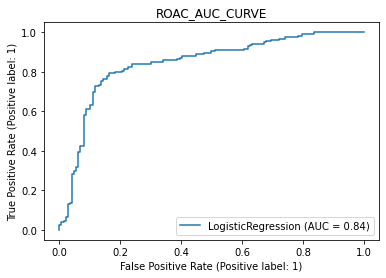

In [130]:
plot_roc_curve(LO,x_test,y_test)
plt.title('ROAC_AUC_CURVE')
plt.show()

Model give auc score is 84%

# MODEL-->DECISION TREE CLASSIFIER

In [131]:
max_acc=0
max_rand=0

for i in range(0,40):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=i)
    DT.fit(x_train,y_train)
    pred=DT.predict(x_test)
    acc=accuracy_score(y_test,pred)*100
    print(f'At random state {i} model give accuracy score is {acc}%')
    
    if acc>max_acc:
        max_acc=acc
        max_rand=i
        print(f"At random state {i} model give max_accuracy {max_acc}")
        print('\n')

At random state 0 model give accuracy score is 83.44370860927152%
At random state 0 model give max_accuracy 83.44370860927152


At random state 1 model give accuracy score is 85.09933774834437%
At random state 1 model give max_accuracy 85.09933774834437


At random state 2 model give accuracy score is 86.75496688741721%
At random state 2 model give max_accuracy 86.75496688741721


At random state 3 model give accuracy score is 83.44370860927152%
At random state 4 model give accuracy score is 84.43708609271523%
At random state 5 model give accuracy score is 85.43046357615894%
At random state 6 model give accuracy score is 83.11258278145695%
At random state 7 model give accuracy score is 81.12582781456953%
At random state 8 model give accuracy score is 88.0794701986755%
At random state 8 model give max_accuracy 88.0794701986755


At random state 9 model give accuracy score is 84.10596026490066%
At random state 10 model give accuracy score is 84.43708609271523%
At random state 11 model gi

At random state 27 model give accuracy score is 89.07%

In [132]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=27)
DT.fit(x_train,y_train)
pred_test=DT.predict(x_test)
pred_train=DT.predict(x_train)

confusion=confusion_matrix(y_test,pred_test)
print(f"Confusion Matrix : {confusion}")

classification=classification_report(y_test,pred_test)
print(f"Classifiaction Report : {classification}")

test_DT=accuracy_score(y_test,pred_test)
print(f"Accuracy_Test : {test_DT}")

train_DT=accuracy_score(y_train,pred_train)
print(f"Accuracy_Train : {train_DT}")

Confusion Matrix : [[127  22]
 [ 18 135]]
Classifiaction Report :               precision    recall  f1-score   support

           0       0.88      0.85      0.86       149
           1       0.86      0.88      0.87       153

    accuracy                           0.87       302
   macro avg       0.87      0.87      0.87       302
weighted avg       0.87      0.87      0.87       302

Accuracy_Test : 0.8675496688741722
Accuracy_Train : 1.0


# This model Give Information-->
1. No fraud chances is 88%
2. Fraud chances is 86%
3. Accuracy by model is 86.75%
4. Avg Score is 87%
5. Do more analysis for best model

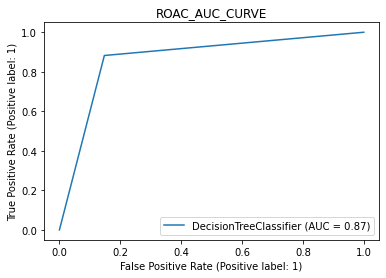

In [133]:
plot_roc_curve(DT,x_test,y_test)
plt.title('ROAC_AUC_CURVE')
plt.show()

The model gives AUC score is 87%

# MODEL-->SVC

In [134]:
max_acc=0
max_rand=0

for i in range(0,40):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=i)
    SV.fit(x_train,y_train)
    pred=SV.predict(x_test)
    acc=accuracy_score(y_test,pred)*100
    print(f'At random state {i} model give accuracy score is {acc}%')
    
    if acc>max_acc:
        max_acc=acc
        max_rand=i
        print(f"At random state {i} model give max_accuracy {max_acc}")
        print('\n')

At random state 0 model give accuracy score is 83.11258278145695%
At random state 0 model give max_accuracy 83.11258278145695


At random state 1 model give accuracy score is 83.11258278145695%
At random state 2 model give accuracy score is 82.78145695364239%
At random state 3 model give accuracy score is 87.41721854304636%
At random state 3 model give max_accuracy 87.41721854304636


At random state 4 model give accuracy score is 86.75496688741721%
At random state 5 model give accuracy score is 87.74834437086093%
At random state 5 model give max_accuracy 87.74834437086093


At random state 6 model give accuracy score is 85.09933774834437%
At random state 7 model give accuracy score is 81.78807947019867%
At random state 8 model give accuracy score is 87.08609271523179%
At random state 9 model give accuracy score is 81.45695364238411%
At random state 10 model give accuracy score is 85.76158940397352%
At random state 11 model give accuracy score is 84.76821192052981%
At random state 12 m

At random state 15 model giev accuracy score is 88.74

In [135]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=15)
SV.fit(x_train,y_train)
pred_test=SV.predict(x_test)
pred_train=SV.predict(x_train)

confusion=confusion_matrix(y_test,pred_test)
print(f"Confusion Matrix : {confusion}")

classification=classification_report(y_test,pred_test)
print(f"Classifiaction Report : {classification}")

test_SV=accuracy_score(y_test,pred_test)
print(f"Accuracy_Test : {test_SV}")

train_SV=accuracy_score(y_train,pred_train)
print(f"Accuracy_Train : {train_SV}")

Confusion Matrix : [[126  21]
 [ 13 142]]
Classifiaction Report :               precision    recall  f1-score   support

           0       0.91      0.86      0.88       147
           1       0.87      0.92      0.89       155

    accuracy                           0.89       302
   macro avg       0.89      0.89      0.89       302
weighted avg       0.89      0.89      0.89       302

Accuracy_Test : 0.8874172185430463
Accuracy_Train : 0.9451827242524917


# This model Give Information-->
1. No fraud chances is 91%
2. Fraud chances is 87%
3. Accuracy by model is 88.74%
4. Avg Score is 89%
5. Do more analysis for best model

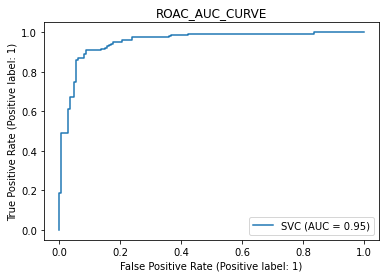

In [136]:
plot_roc_curve(SV,x_test,y_test)
plt.title('ROAC_AUC_CURVE')
plt.show()

The model gives AUC score is 95%

# MODEL-->KNEIGHBORS CLASSIFIER

In [137]:
max_acc=0
max_rand=0

for i in range(0,40):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=i)
    KN.fit(x_train,y_train)
    pred=KN.predict(x_test)
    acc=accuracy_score(y_test,pred)*100
    print(f'At random state {i} model give accuracy score is {acc}%')
    
    if acc>max_acc:
        max_acc=acc
        max_rand=i
        print(f"At random state {i} model give max_accuracy {max_acc}")
        print('\n')

At random state 0 model give accuracy score is 66.22516556291392%
At random state 0 model give max_accuracy 66.22516556291392


At random state 1 model give accuracy score is 64.90066225165563%
At random state 2 model give accuracy score is 71.52317880794702%
At random state 2 model give max_accuracy 71.52317880794702


At random state 3 model give accuracy score is 67.21854304635761%
At random state 4 model give accuracy score is 70.52980132450331%
At random state 5 model give accuracy score is 69.5364238410596%
At random state 6 model give accuracy score is 67.21854304635761%
At random state 7 model give accuracy score is 69.5364238410596%
At random state 8 model give accuracy score is 67.21854304635761%
At random state 9 model give accuracy score is 69.20529801324503%
At random state 10 model give accuracy score is 73.17880794701986%
At random state 10 model give max_accuracy 73.17880794701986


At random state 11 model give accuracy score is 69.20529801324503%
At random state 12 mo

At random state 29 model give accuracy score is 75.82

In [138]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=29)
KN.fit(x_train,y_train)
pred_test=KN.predict(x_test)
pred_train=KN.predict(x_train)

confusion=confusion_matrix(y_test,pred_test)
print(f"Confusion Matrix : {confusion}")

classification=classification_report(y_test,pred_test)
print(f"Classifiaction Report : {classification}")

test_KN=accuracy_score(y_test,pred_test)
print(f"Accuracy_Test : {test_KN}")

train_KN=accuracy_score(y_train,pred_train)
print(f"Accuracy_Train : {train_KN}")

Confusion Matrix : [[ 74  67]
 [  6 155]]
Classifiaction Report :               precision    recall  f1-score   support

           0       0.93      0.52      0.67       141
           1       0.70      0.96      0.81       161

    accuracy                           0.76       302
   macro avg       0.81      0.74      0.74       302
weighted avg       0.80      0.76      0.74       302

Accuracy_Test : 0.7582781456953642
Accuracy_Train : 0.7832225913621262


# This model Give Information-->
1. No fraud chances is 93%
2. Fraud chances is 70%
3. Accuracy by model is 75.82%
4. Avg Score is 81%
5. Do more analysis for best model

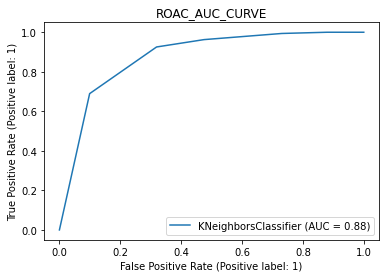

In [139]:
plot_roc_curve(KN,x_test,y_test)
plt.title('ROAC_AUC_CURVE')
plt.show()

The model gives AUC score is 88%

# MODEL-->ADA BOOST CLASSIFIER

In [140]:
max_acc=0
max_rand=0

for i in range(0,40):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=i)
    AD.fit(x_train,y_train)
    pred=AD.predict(x_test)
    acc=accuracy_score(y_test,pred)*100
    print(f'At random state {i} model give accuracy score is {acc}%')
    
    if acc>max_acc:
        max_acc=acc
        max_rand=i
        print(f"At random state {i} model give max_accuracy {max_acc}")
        print('\n')

At random state 0 model give accuracy score is 81.78807947019867%
At random state 0 model give max_accuracy 81.78807947019867


At random state 1 model give accuracy score is 84.76821192052981%
At random state 1 model give max_accuracy 84.76821192052981


At random state 2 model give accuracy score is 86.75496688741721%
At random state 2 model give max_accuracy 86.75496688741721


At random state 3 model give accuracy score is 88.41059602649007%
At random state 3 model give max_accuracy 88.41059602649007


At random state 4 model give accuracy score is 86.75496688741721%
At random state 5 model give accuracy score is 87.08609271523179%
At random state 6 model give accuracy score is 88.41059602649007%
At random state 7 model give accuracy score is 83.77483443708608%
At random state 8 model give accuracy score is 87.74834437086093%
At random state 9 model give accuracy score is 86.42384105960265%
At random state 10 model give accuracy score is 85.43046357615894%
At random state 11 model 

At random state 15 model give accuracy score is 90.40

In [140]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=15)
AD.fit(x_train,y_train)
pred_test=AD.predict(x_test)
pred_train=AD.predict(x_train)

confusion=confusion_matrix(y_test,pred_test)
print(f"Confusion Matrix : {confusion}")

classification=classification_report(y_test,pred_test)
print(f"Classifiaction Report : {classification}")

test_AD=accuracy_score(y_test,pred_test)
print(f"Accuracy_Test : {test_AD}")

train_AD=accuracy_score(y_train,pred_train)
print(f"Accuracy_Train : {train_AD}")

Confusion Matrix : [[130  17]
 [ 17 138]]
Classifiaction Report :               precision    recall  f1-score   support

           0       0.88      0.88      0.88       147
           1       0.89      0.89      0.89       155

    accuracy                           0.89       302
   macro avg       0.89      0.89      0.89       302
weighted avg       0.89      0.89      0.89       302

Accuracy_Test : 0.8874172185430463
Accuracy_Train : 0.8953488372093024


# This model Give Information-->
1. No fraud chances is 88%
2. Fraud chances is 89%
3. Accuracy by model is 88.74%
4. Avg Score is 89%
5. Do more analysis for best model

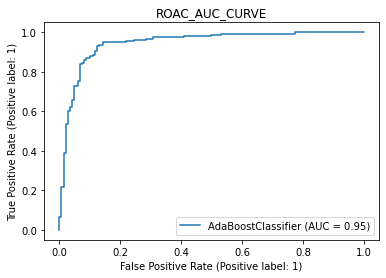

In [141]:
plot_roc_curve(AD,x_test,y_test)
plt.title('ROAC_AUC_CURVE')
plt.show()

The model gives AUC score is 95%

# MODEL-->GRADIENT BOOSTING CLASSIFIER

In [142]:
max_acc=0
max_rand=0

for i in range(0,40):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=i)
    GR.fit(x_train,y_train)
    pred=GR.predict(x_test)
    acc=accuracy_score(y_test,pred)*100
    print(f'At random state {i} model give accuracy score is {acc}%')
    
    if acc>max_acc:
        max_acc=acc
        max_rand=i
        print(f"At random state {i} model give max_accuracy {max_acc}")
        print('\n')

At random state 0 model give accuracy score is 85.43046357615894%
At random state 0 model give max_accuracy 85.43046357615894


At random state 1 model give accuracy score is 87.41721854304636%
At random state 1 model give max_accuracy 87.41721854304636


At random state 2 model give accuracy score is 88.74172185430463%
At random state 2 model give max_accuracy 88.74172185430463


At random state 3 model give accuracy score is 90.39735099337747%
At random state 3 model give max_accuracy 90.39735099337747


At random state 4 model give accuracy score is 89.40397350993378%
At random state 5 model give accuracy score is 91.3907284768212%
At random state 5 model give max_accuracy 91.3907284768212


At random state 6 model give accuracy score is 90.06622516556291%
At random state 7 model give accuracy score is 87.08609271523179%
At random state 8 model give accuracy score is 92.05298013245033%
At random state 8 model give max_accuracy 92.05298013245033


At random state 9 model give accurac

At random state 8 model give accuracy score is 92.05

In [143]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=8)
GR.fit(x_train,y_train)
pred_test=GR.predict(x_test)
pred_train=GR.predict(x_train)

confusion=confusion_matrix(y_test,pred_test)
print(f"Confusion Matrix : {confusion}")

classification=classification_report(y_test,pred_test)
print(f"Classifiaction Report : {classification}")

test_GR=accuracy_score(y_test,pred_test)
print(f"Accuracy_Test : {test_GR}")

train_GR=accuracy_score(y_train,pred_train)
print(f"Accuracy_Train : {train_GR}")

Confusion Matrix : [[146  14]
 [ 10 132]]
Classifiaction Report :               precision    recall  f1-score   support

           0       0.94      0.91      0.92       160
           1       0.90      0.93      0.92       142

    accuracy                           0.92       302
   macro avg       0.92      0.92      0.92       302
weighted avg       0.92      0.92      0.92       302

Accuracy_Test : 0.9205298013245033
Accuracy_Train : 0.9493355481727574


# This model Give Information-->
1. No fraud chances is 94%
2. Fraud chances is 90%
3. Accuracy by model is 92.05%
4. Avg Score is 92%
5. Do more analysis for best model

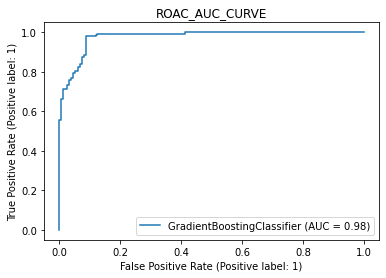

In [144]:
plot_roc_curve(GR,x_test,y_test)
plt.title('ROAC_AUC_CURVE')
plt.show()

The model gives AUC score is 98%

# MODEL-->RANDOM FOREST CLASSIFIER

In [145]:
max_acc=0
max_rand=0

for i in range(0,40):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=i)
    RF.fit(x_train,y_train)
    pred=RF.predict(x_test)
    acc=accuracy_score(y_test,pred)*100
    print(f'At random state {i} model give accuracy score is {acc}%')
    
    if acc>max_acc:
        max_acc=acc
        max_rand=i
        print(f"At random state {i} model give max_accuracy {max_acc}")
        print('\n')

At random state 0 model give accuracy score is 84.43708609271523%
At random state 0 model give max_accuracy 84.43708609271523


At random state 1 model give accuracy score is 85.43046357615894%
At random state 1 model give max_accuracy 85.43046357615894


At random state 2 model give accuracy score is 87.74834437086093%
At random state 2 model give max_accuracy 87.74834437086093


At random state 3 model give accuracy score is 89.0728476821192%
At random state 3 model give max_accuracy 89.0728476821192


At random state 4 model give accuracy score is 87.74834437086093%
At random state 5 model give accuracy score is 90.39735099337747%
At random state 5 model give max_accuracy 90.39735099337747


At random state 6 model give accuracy score is 89.0728476821192%
At random state 7 model give accuracy score is 86.42384105960265%
At random state 8 model give accuracy score is 91.72185430463577%
At random state 8 model give max_accuracy 91.72185430463577


At random state 9 model give accuracy

At random state 8 model give acuracy score is 91.72

In [146]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=8)
RF.fit(x_train,y_train)
pred_test=RF.predict(x_test)
pred_train=RF.predict(x_train)

confusion=confusion_matrix(y_test,pred_test)
print(f"Confusion Matrix : {confusion}")

classification=classification_report(y_test,pred_test)
print(f"Classifiaction Report : {classification}")

test_RF=accuracy_score(y_test,pred_test)
print(f"Accuracy_Test : {test_RF}")

train_RF=accuracy_score(y_train,pred_train)
print(f"Accuracy_Train : {train_RF}")

Confusion Matrix : [[144  16]
 [ 11 131]]
Classifiaction Report :               precision    recall  f1-score   support

           0       0.93      0.90      0.91       160
           1       0.89      0.92      0.91       142

    accuracy                           0.91       302
   macro avg       0.91      0.91      0.91       302
weighted avg       0.91      0.91      0.91       302

Accuracy_Test : 0.9105960264900662
Accuracy_Train : 1.0


# This model Give Information-->
1. No fraud chances is 93%
2. Fraud chances is 89%
3. Accuracy by model is 91.06%
4. Avg Score is 91%
5. Do more analysis for best model

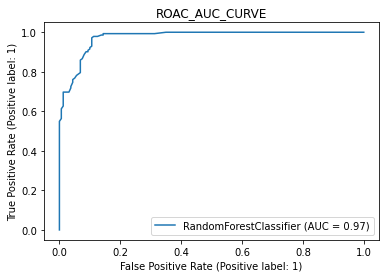

In [147]:
plot_roc_curve(RF,x_test,y_test)
plt.title('ROAC_AUC_CURVE')
plt.show()

The model gives AUC score is 97%

# MODEL-> EXTRA TREE CLASSIFIER

In [148]:
max_acc=0
max_rand=0

for i in range(0,40):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=i)
    EX.fit(x_train,y_train)
    pred=EX.predict(x_test)
    acc=accuracy_score(y_test,pred)*100
    print(f'At random state {i} model give accuracy score is {acc}%')
    
    if acc>max_acc:
        max_acc=acc
        max_rand=i
        print(f"At random state {i} model give max_accuracy {max_acc}")
        print('\n')

At random state 0 model give accuracy score is 88.74172185430463%
At random state 0 model give max_accuracy 88.74172185430463


At random state 1 model give accuracy score is 89.40397350993378%
At random state 1 model give max_accuracy 89.40397350993378


At random state 2 model give accuracy score is 91.72185430463577%
At random state 2 model give max_accuracy 91.72185430463577


At random state 3 model give accuracy score is 90.72847682119205%
At random state 4 model give accuracy score is 92.05298013245033%
At random state 4 model give max_accuracy 92.05298013245033


At random state 5 model give accuracy score is 92.3841059602649%
At random state 5 model give max_accuracy 92.3841059602649


At random state 6 model give accuracy score is 91.05960264900662%
At random state 7 model give accuracy score is 88.0794701986755%
At random state 8 model give accuracy score is 95.36423841059603%
At random state 8 model give max_accuracy 95.36423841059603


At random state 9 model give accuracy

At random state 8 model give accuracy score is 95.36%

In [149]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=8)
EX.fit(x_train,y_train)
pred_test=EX.predict(x_test)
pred_train=EX.predict(x_train)

confusion=confusion_matrix(y_test,pred_test)
print(f"Confusion Matrix : {confusion}")

classification=classification_report(y_test,pred_test)
print(f"Classifiaction Report : {classification}")

test_EX=accuracy_score(y_test,pred_test)
print(f"Accuracy_Test : {test_EX}")

train_EX=accuracy_score(y_train,pred_train)
print(f"Accuracy_Train : {train_EX}")

Confusion Matrix : [[146  14]
 [  5 137]]
Classifiaction Report :               precision    recall  f1-score   support

           0       0.97      0.91      0.94       160
           1       0.91      0.96      0.94       142

    accuracy                           0.94       302
   macro avg       0.94      0.94      0.94       302
weighted avg       0.94      0.94      0.94       302

Accuracy_Test : 0.9370860927152318
Accuracy_Train : 1.0


# This model Give Information-->
1. No fraud chances is 97%
2. Fraud chances is 91%
3. Accuracy by model is 93.37%
4. Avg Score is 94%
5. Do more analysis for best model

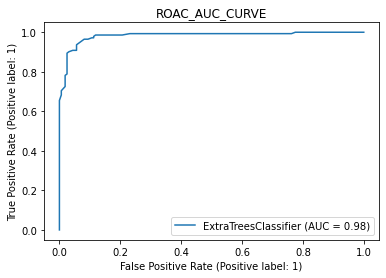

In [150]:
plot_roc_curve(EX,x_test,y_test)
plt.title('ROAC_AUC_CURVE')
plt.show()

The model give AUC SCORE is 98%

In [151]:
m=[LO,DT,SV,KN,AD,GR,RF,EX]
model=[]
for i in m:
    model.append(i)
    
test=[test_LO,test_DT,test_SV,test_KN,test_AD,test_GR,test_RF,test_EX]
TEST=[]
for i in test:
    TEST.append(i)
    
train=[train_LO,train_DT,train_SV,train_KN,train_AD,train_GR,train_RF,train_EX]
TRAIN=[]
for i in train:
    TRAIN.append(i)

In [152]:
DF=pd.DataFrame({'MODEL':model,"TEST_ACCURACY":TEST,"TRAIN_ACCURACY":TRAIN})
DF

,MODEL,TEST_ACCURACY,TRAIN_ACCURACY
0,LogisticRegression(),0.798013,0.742525
1,DecisionTreeClassifier(),0.867550,1.000000
2,SVC(),0.887417,0.945183
3,KNeighborsClassifier(),0.758278,0.783223
4,"(DecisionTreeClassifier(max_depth=1, random_st...",0.887417,0.895349
5,([DecisionTreeRegressor(criterion='friedman_ms...,0.920530,0.949336
6,"(DecisionTreeClassifier(max_features='sqrt', r...",0.910596,1.000000
7,"(ExtraTreeClassifier(random_state=391066686), ...",0.937086,1.000000


# Best Model BY Train Test Split is EXTRA TREE CLASSIFIER
1. Accuracy of model-->93.70%
2. Train accuracy-->100%
3. Avg of model-->93%
4. Auc score (Highest)-->98%

# Try 2nd Model Selection method for find best accuracy

# CROSS VAL SCORE

# CV-->LOGISTIC REGRESSION

In [153]:
pred=LO.predict(x_test)
accuracy_LO=accuracy_score(y_test,pred)*100
for i in range(2,10):
    cv=cross_val_score(LO,x,y,cv=i)
    mean_score_LO=cv.mean()*100
    print(f"At cv {i} model give mean score is {mean_score_LO} and accuracy score is {accuracy_LO} ")
    print('\n')

At cv 2 model give mean score is 74.9667994687915 and accuracy score is 77.81456953642383 


At cv 3 model give mean score is 74.43559096945552 and accuracy score is 77.81456953642383 


At cv 4 model give mean score is 74.30406625656076 and accuracy score is 77.81456953642383 


At cv 5 model give mean score is 74.76843193769113 and accuracy score is 77.81456953642383 


At cv 6 model give mean score is 74.50199203187252 and accuracy score is 77.81456953642383 


At cv 7 model give mean score is 74.76959517657191 and accuracy score is 77.81456953642383 


At cv 8 model give mean score is 74.57080941123493 and accuracy score is 77.81456953642383 


At cv 9 model give mean score is 74.50258213731267 and accuracy score is 77.81456953642383 




At cv 2 model give mean score is 74.96 and accuracy score is 77.81

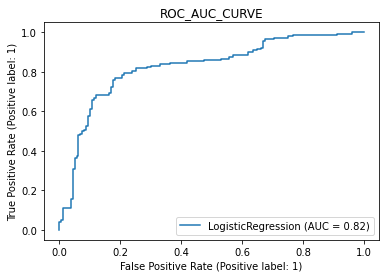

In [154]:
plot_roc_curve(LO,x_test,y_test)
plt.title('ROC_AUC_CURVE')
plt.show()

The model gives AUC score is 82%

# CV-->DECISION TREE CLASSIFIER

In [155]:
pred=DT.predict(x_test)
accuracy_DT=accuracy_score(y_test,pred)*100
for i in range(2,10):
    cv=cross_val_score(DT,x,y,cv=i)
    mean_score_DT=cv.mean()*100
    print(f"At cv {i} model give mean score is {mean_score_DT} and accuracy score is {accuracy_DT} ")
    print('\n')

At cv 2 model give mean score is 80.54448871181938 and accuracy score is 98.01324503311258 


At cv 3 model give mean score is 83.06772908366534 and accuracy score is 98.01324503311258 


At cv 4 model give mean score is 84.00128393250183 and accuracy score is 98.01324503311258 


At cv 5 model give mean score is 82.81005918461639 and accuracy score is 98.01324503311258 


At cv 6 model give mean score is 84.06374501992032 and accuracy score is 98.01324503311258 


At cv 7 model give mean score is 84.13528977482467 and accuracy score is 98.01324503311258 


At cv 8 model give mean score is 82.350768321513 and accuracy score is 98.01324503311258 


At cv 9 model give mean score is 84.27985299242783 and accuracy score is 98.01324503311258 




 At cv 9 model give mean score is 84.28 and accuracy score is 98.01

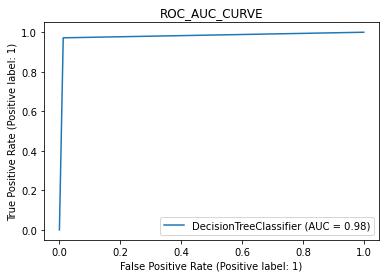

In [156]:
plot_roc_curve(DT,x_test,y_test)
plt.title('ROC_AUC_CURVE')
plt.show()

The model gives AUC score is 98%

# CV-->SVC

In [157]:
pred=SV.predict(x_test)
accuracy_SV=accuracy_score(y_test,pred)*100
for i in range(2,10):
    cv=cross_val_score(SV,x,y,cv=i)
    mean_score_SV=cv.mean()*100
    print(f"At cv {i} model give mean score is {mean_score_SV} and accuracy score is {accuracy_SV} ")
    print('\n')

At cv 2 model give mean score is 81.73970783532536 and accuracy score is 94.03973509933775 


At cv 3 model give mean score is 82.80212483399735 and accuracy score is 94.03973509933775 


At cv 4 model give mean score is 84.06583328630283 and accuracy score is 94.03973509933775 


At cv 5 model give mean score is 84.92992453411367 and accuracy score is 94.03973509933775 


At cv 6 model give mean score is 85.2589641434263 and accuracy score is 94.03973509933775 


At cv 7 model give mean score is 85.39621016365201 and accuracy score is 94.03973509933775 


At cv 8 model give mean score is 85.33258752673646 and accuracy score is 94.03973509933775 


At cv 9 model give mean score is 85.93250007920666 and accuracy score is 94.03973509933775 




At cv 5 model give mean score is 85.93 and accuracy score is 94.04

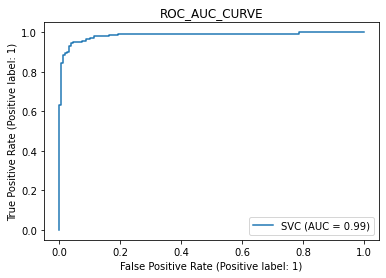

In [158]:
plot_roc_curve(SV,x_test,y_test)
plt.title('ROC_AUC_CURVE')
plt.show()

The model gives AUC score is 99%

# CV-->KNEIGHBORS CLASSIFIER

In [159]:
pred=KN.predict(x_test)
accuracy_KN=accuracy_score(y_test,pred)*100
for i in range(2,10):
    cv=cross_val_score(KN,x,y,cv=i)
    mean_score_KN=cv.mean()*100
    print(f"At cv {i} model give mean score is {mean_score_KN} and accuracy score is {accuracy_KN} ")
    print('\n')

At cv 2 model give mean score is 69.05710491367863 and accuracy score is 77.48344370860927 


At cv 3 model give mean score is 69.18990703851262 and accuracy score is 77.48344370860927 


At cv 4 model give mean score is 70.32052457813647 and accuracy score is 77.48344370860927 


At cv 5 model give mean score is 70.45411542100284 and accuracy score is 77.48344370860927 


At cv 6 model give mean score is 70.05312084993362 and accuracy score is 77.48344370860927 


At cv 7 model give mean score is 69.99015626922603 and accuracy score is 77.48344370860927 


At cv 8 model give mean score is 70.32252617359 and accuracy score is 77.48344370860927 


At cv 9 model give mean score is 69.85829927446693 and accuracy score is 77.48344370860927 




At cv 5 model give mean score is 70.45 and accuracy score is 77.48

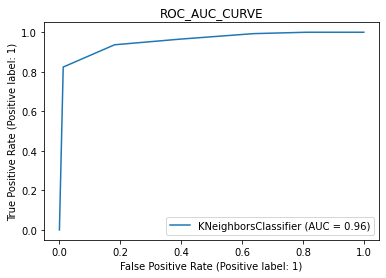

In [160]:
plot_roc_curve(KN,x_test,y_test)
plt.title('ROC_AUC_CURVE')
plt.show()

The model gives AUC score is 96%

# CV-->ADA BOOST CLASSIFIER

In [161]:
pred=AD.predict(x_test)
accuracy_AD=accuracy_score(y_test,pred)*100
for i in range(2,10):
    cv=cross_val_score(AD,x,y,cv=i)
    mean_score_AD=cv.mean()*100
    print(f"At cv {i} model give mean score is {mean_score_AD} and accuracy score is {accuracy_AD} ")
    print('\n')

At cv 2 model give mean score is 81.00929614873837 and accuracy score is 91.05960264900662 


At cv 3 model give mean score is 78.68525896414343 and accuracy score is 91.05960264900662 


At cv 4 model give mean score is 84.27147412382189 and accuracy score is 91.05960264900662 


At cv 5 model give mean score is 84.53807396976964 and accuracy score is 91.05960264900662 


At cv 6 model give mean score is 83.66533864541833 and accuracy score is 91.05960264900662 


At cv 7 model give mean score is 85.39990156269226 and accuracy score is 91.05960264900662 


At cv 8 model give mean score is 85.47541652594843 and accuracy score is 91.05960264900662 


At cv 9 model give mean score is 84.49014669074549 and accuracy score is 91.05960264900662 




At cv 9 model give mean score is 85.47 and accuracy score is 91.06

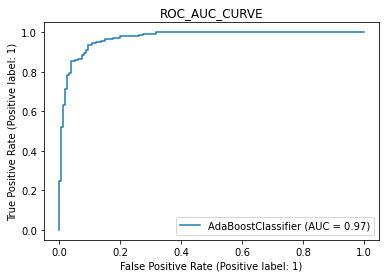

In [162]:
plot_roc_curve(AD,x_test,y_test)
plt.title('ROC_AUC_CURVE')
plt.show()

The model gives AUC score is 97%

# CV-->GRADIENT BOOSTING CLASSIFIER

In [163]:
pred=GR.predict(x_test)
accuracy_GR=accuracy_score(y_test,pred)*100
for i in range(2,10):
    cv=cross_val_score(GR,x,y,cv=i)
    mean_score_GR=cv.mean()*100
    print(f"At cv {i} model give mean score is {mean_score_GR} and accuracy score is {accuracy_GR} ")
    print('\n')

At cv 2 model give mean score is 83.00132802124833 and accuracy score is 92.05298013245033 


At cv 3 model give mean score is 80.2124833997344 and accuracy score is 92.05298013245033 


At cv 4 model give mean score is 85.79720215587787 and accuracy score is 92.05298013245033 


At cv 5 model give mean score is 87.19258102131967 and accuracy score is 92.05298013245033 


At cv 6 model give mean score is 86.52058432934928 and accuracy score is 92.05298013245033 


At cv 7 model give mean score is 86.79309708379476 and accuracy score is 92.05298013245033 


At cv 8 model give mean score is 87.66252955082741 and accuracy score is 92.05298013245033 


At cv 9 model give mean score is 87.59900833254126 and accuracy score is 92.05298013245033 




At cv 8 model giev mean score is 87.66 and accuracy scoer is 92.05

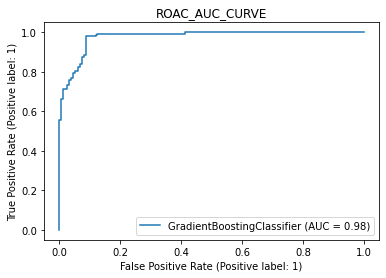

In [164]:
plot_roc_curve(GR,x_test,y_test)
plt.title('ROAC_AUC_CURVE')
plt.show()

The model gives AUC score is 98%

# CV-->RANDOM FOREST CLASSIFIER

In [165]:
pred=RF.predict(x_test)
accuracy_RF=accuracy_score(y_test,pred)*100
for i in range(2,10):
    cv=cross_val_score(RF,x,y,cv=i)
    mean_score_RF=cv.mean()*100
    print(f"At cv {i} model give mean score is {mean_score_RF} and accuracy score is {accuracy_RF} ")
    print('\n')

At cv 2 model give mean score is 84.1301460823373 and accuracy score is 91.05960264900662 


At cv 3 model give mean score is 85.0597609561753 and accuracy score is 91.05960264900662 


At cv 4 model give mean score is 85.99667024098426 and accuracy score is 91.05960264900662 


At cv 5 model give mean score is 86.46278409715957 and accuracy score is 91.05960264900662 


At cv 6 model give mean score is 86.18857901726427 and accuracy score is 91.05960264900662 


At cv 7 model give mean score is 87.32465854558879 and accuracy score is 91.05960264900662 


At cv 8 model give mean score is 86.93466452774963 and accuracy score is 91.05960264900662 


At cv 9 model give mean score is 87.005750403954 and accuracy score is 91.05960264900662 




At cv model 7 give mean score is 87.32 and daccuracy score is 91.06

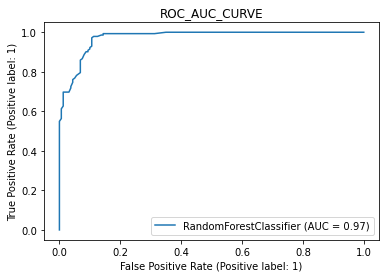

In [166]:
plot_roc_curve(RF,x_test,y_test)
plt.title('ROC_AUC_CURVE')
plt.show()

The model gives AUC score is 97%

# CV-->EXTRA TREE CLASSIFIER

In [167]:
pred=EX.predict(x_test)
accuracy_EX=accuracy_score(y_test,pred)*100
for i in range(2,10):
    cv=cross_val_score(EX,x,y,cv=i)
    mean_score_EX=cv.mean()*100
    print(f"At cv {i} model give mean score is {mean_score_EX} and accuracy score is {accuracy_EX} ")
    print('\n')

At cv 2 model give mean score is 89.7742363877822 and accuracy score is 93.70860927152319 


At cv 3 model give mean score is 90.63745019920319 and accuracy score is 93.70860927152319 


At cv 4 model give mean score is 90.64157824933687 and accuracy score is 93.70860927152319 


At cv 5 model give mean score is 91.10646630437174 and accuracy score is 93.70860927152319 


At cv 6 model give mean score is 91.30146082337318 and accuracy score is 93.70860927152319 


At cv 7 model give mean score is 91.23938722775932 and accuracy score is 93.70860927152319 


At cv 8 model give mean score is 90.97749915569065 and accuracy score is 93.70860927152319 


At cv 9 model give mean score is 90.91539143934355 and accuracy score is 93.70860927152319 




At cv model 6 give mean score is 91.30 and daccuracy score is 93.70

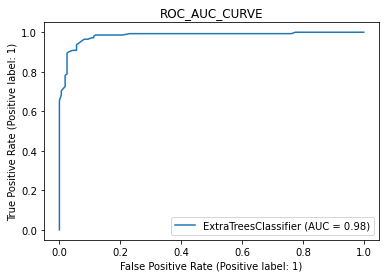

In [168]:
plot_roc_curve(EX,x_test,y_test)
plt.title('ROC_AUC_CURVE')
plt.show()

The model give AUC SCORE is  98%

In [169]:
m=[LO,DT,SV,KN,AD,GR,RF,EX]
model=[]
for i in m:
    model.append(i)
    
mean=[mean_score_LO,mean_score_DT,mean_score_SV,mean_score_KN,mean_score_AD,mean_score_GR,mean_score_RF,mean_score_EX]
MEAN=[]
for i in mean:
    MEAN.append(i)
    
accuracy=[accuracy_LO,accuracy_DT,accuracy_SV,accuracy_KN,accuracy_AD,accuracy_GR,accuracy_RF,accuracy_EX]
ACCURACY=[]
for i in accuracy:
    ACCURACY.append(i)

In [170]:
DF=pd.DataFrame({'MODEL':model,"MEAN_SCORE":MEAN,"ACCURACY":ACCURACY})
DF

,MODEL,MEAN_SCORE,ACCURACY
0,LogisticRegression(),74.502582,77.814570
1,DecisionTreeClassifier(),84.279853,98.013245
2,SVC(),85.932500,94.039735
3,KNeighborsClassifier(),69.858299,77.483444
4,"(DecisionTreeClassifier(max_depth=1, random_st...",84.490147,91.059603
5,([DecisionTreeRegressor(criterion='friedman_ms...,87.599008,92.052980
6,"(DecisionTreeClassifier(max_features='sqrt', r...",87.005750,91.059603
7,"(ExtraTreeClassifier(random_state=391066686), ...",90.915391,93.708609


As we seen that in all model diffrence between accuracy score and mean score is very less for EXTRA TREE CLASSIFIER MODEL.

# Best model in CROSS VAL SCORE IS ECTRA TREE CLASSIFIER
1. MEAN SCORE-->91.37
2. ACCURACY SCORE-->93.70

# HYPER TUNING METHOD-->GRID SEARCH CV

In [171]:
dict1={'criterion':['gini','entropy','log_loss'],'max_features':['sqrt','log2','None'],'n_estimators':[100,200,300,400,500],
      'max_depth':[3,4,5,6,7],'n_jobs':[-2,-1,1,2]}

In [173]:
Gs=GridSearchCV(EX,dict1,cv=6)

In [174]:
Gs.fit(x,y)

exception calling callback for <Future at 0x25473ace520 state=finished raised ValueError>
Traceback (most recent call last):
  File "C:\Users\PAVILION\anaconda3\lib\site-packages\joblib\externals\loky\_base.py", line 625, in _invoke_callbacks
    callback(self)
  File "C:\Users\PAVILION\anaconda3\lib\site-packages\joblib\parallel.py", line 359, in __call__
    self.parallel.dispatch_next()
  File "C:\Users\PAVILION\anaconda3\lib\site-packages\joblib\parallel.py", line 794, in dispatch_next
    if not self.dispatch_one_batch(self._original_iterator):
  File "C:\Users\PAVILION\anaconda3\lib\site-packages\joblib\parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\PAVILION\anaconda3\lib\site-packages\joblib\parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "C:\Users\PAVILION\anaconda3\lib\site-packages\joblib\_parallel_backends.py", line 531, in apply_async
    future = self._workers.submit(SafeFunction(

GridSearchCV(cv=6, estimator=ExtraTreesClassifier(),
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [3, 4, 5, 6, 7],
                         'max_features': ['sqrt', 'log2', 'None'],
                         'n_estimators': [100, 200, 300, 400, 500],
                         'n_jobs': [-2, -1, 1, 2]})

In [175]:
Gs.best_params_

{'criterion': 'gini',
 'max_depth': 7,
 'max_features': 'log2',
 'n_estimators': 300,
 'n_jobs': -1}

In [176]:
Gs.best_score_

0.8698539176626826

In [177]:
Gs.best_estimator_

ExtraTreesClassifier(max_depth=7, max_features='log2', n_estimators=300,
                     n_jobs=-1)

# Analyse model with full feature

In [178]:
Ex=ExtraTreesClassifier(criterion='gini',max_features='log2',n_estimators=300,max_depth=7,n_jobs=-1)
Ex.fit(x_train,y_train)
pred_test=Ex.predict(x_test)
print(f"Confusion Matrix : {confusion_matrix(y_test,pred_test)}")
print(f"Classification Report : {classification_report(y_test,pred_test)}")
print(f"Accuracy Score of Model  : {(accuracy_score(y_test,pred_test)*100)}")
print(f"Dataset Score : {(Ex.score(x_train,y_train))*100}")

Confusion Matrix : [[140  20]
 [ 10 132]]
Classification Report :               precision    recall  f1-score   support

           0       0.93      0.88      0.90       160
           1       0.87      0.93      0.90       142

    accuracy                           0.90       302
   macro avg       0.90      0.90      0.90       302
weighted avg       0.90      0.90      0.90       302

Accuracy Score of Model  : 90.06622516556291
Dataset Score : 92.85714285714286


After tuning then model with grid search cv then accuracy comes 90.06%

# Plotting ROC and Compare AUC for the best model

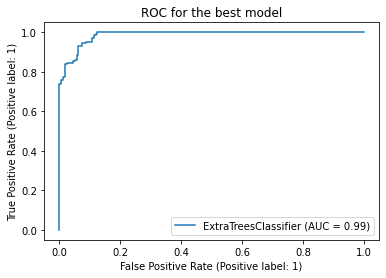

In [179]:
# Let's check the Auc for the best model after hyper parameter tuning
plot_roc_curve(Gs.best_estimator_, x_test, y_test)
plt.title("ROC for the best model")
plt.show()

Model give AUC SCORE is 99%

# Saving The Model

In [180]:
# Saving the model using .pkl
import joblib
joblib.dump(Ex,"Insurance_claim_Fraud_Detection.pkl")

['Insurance_claim_Fraud_Detection.pkl']

We have saved our model using joblib library.

In [181]:
# Let's load the saved model and get the prediction

# Loading the saved model
model=joblib.load("Insurance_claim_Fraud_Detection.pkl")

#Prediction
prediction = model.predict(x_test)
prediction

array([1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1,
       1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0,
       0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0,
       0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0,
       1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1,
       1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1,
       1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0,
       0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1,
       1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0,
       1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1,
       0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0,
       1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0,
       1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0,
       1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0,

In [182]:
pd.DataFrame([model.predict(x_test)[:],y_test[:]],index=["Predicted","Original"])

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301
Predicted,1,0,0,1,1,1,1,1,0,0,0,0,0,1,1,1,0,1,1,0,1,1,1,0,1,0,1,0,1,1,1,0,1,1,0,1,1,1,0,1,1,1,1,0,0,0,0,1,1,1,0,1,1,1,1,0,0,1,0,1,1,0,0,1,1,0,0,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,1,0,0,1,0,1,0,1,1,0,1,0,0,0,0,1,0,1,0,1,0,1,0,0,0,1,1,1,0,1,1,0,0,0,1,0,1,0,1,0,1,0,1,0,1,1,0,0,1,1,0,1,0,0,1,0,0,0,1,0,1,0,1,0,1,0,1,0,1,0,0,0,0,0,1,1,0,1,0,0,1,0,0,0,0,1,1,1,1,0,0,1,1,1,1,1,1,0,0,1,0,0,1,0,1,1,0,1,1,0,0,1,0,1,0,1,0,1,1,1,0,0,1,0,1,1,1,0,0,0,1,1,1,1,0,1,1,0,1,0,0,0,0,1,0,1,0,0,0,0,1,1,1,0,1,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,1,0,1,1,0,1,0,1,1,1,0,1,0,1,1,0,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,1,0,1,0,1,0,1,1,0,1,1,1,0,1
Original,1,0,0,1,1,1,1,0,1,0,0,0,0,0,1,1,0,1,1,0,1,1,1,0,0,0,1,0,1,0,1,0,0,1,0,1,0,1,0,0,1,1,1,0,0,0,0,1,1,1,0,1,1,1,1,0,1,1,0,1,1,0,0,1,1,0,0,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,0,0,1,0,1,0,1,0,1,0,0,0,1,1,1,0,1,1,0,0,0,1,0,0,0,0,0,1,0,1,1,1,1,1,1,1,1,0,1,0,0,1,0,0,0,1,0,1,0,1,0,1,0,1,0,1,0,0,0,0,1,1,1,0,1,0,0,0,0,1,0,0,1,1,1,1,0,0,1,1,1,1,1,1,0,0,0,0,1,1,0,1,1,0,1,1,0,0,1,0,1,0,1,0,1,1,1,0,0,1,0,0,1,1,0,0,0,1,0,1,1,0,1,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,1,1,1,0,1,1,1,1,0,0,0,1,1,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,1,1,0,1,1,1,0,1


# Complted

# THANKS :)